### Business Problem Overview

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

### Business Ojective

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully. Prepaid is also the most common model in India and southeast Asia, while postpaid is more common in Europe in North America.

 

This project is based on the Indian and Southeast Asian market.

### Solution Overview

The project starts with understanding the data set,  dropping unnecessary features, deriving features and performing exploratory data analysis. Where possible and required IterativeImputer from SKLearn is used to fill in gaps of numerical data by regression
The project is limited to High Value customers and there is a set definition to drive High Value Customers based on the data set. This definition is applied. The resultant data set is around 30K entries. 

For the south asian market it is enough if a good enough Churn prediction is performed on the high value customers
The below algorithms have been applied on the data set and various models created and compared.

**Principal Component Analysis  (PCA) with Logistic Regression** 

**Logistic Regression with Recursive Feature Elimination**

**Random Forest algorithm based model with Hyper Parameter tuning**

**Gradient Boosting - XGBoost algorithm**

After this the results are compared based on the Confusion Matrix and Accuracy and a good model chosen.
Then based on the model chosen the main features that affect Churn are identified so that some business recommendations can be made




In [487]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline    
pd.options.display.float_format = '{:.2f}'.format
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")

## Data Preparation & Understanding 

In [488]:
#Load the data into a dataframe
telecom = pd.read_csv("telecom_churn_data.csv", low_memory=False)

In [489]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,...,0,1.00,1.00,1.00,nan,968,30.40,0.00,101.20,3.58
1,7001865778,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.05,...,0,nan,1.00,1.00,nan,1006,0.00,0.00,0.00,0.00
2,7001625959,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.69,...,0,nan,nan,nan,1.00,1103,0.00,0.00,4.17,0.00
3,7001204172,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.34,...,0,nan,nan,nan,nan,2491,0.00,0.00,0.00,0.00
4,7000142493,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.64,...,0,0.00,nan,nan,nan,1526,0.00,0.00,0.00,0.00


In [490]:
telecom.shape

(99999, 226)

In [491]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


### Check unique values

In [492]:
#mobile_number is unique
print(telecom.mobile_number.is_unique)
telecom.mobile_number.nunique()

True


99999

### Columns with 70% missing data

In [493]:
# Columns with more than 70% missing values
colmns_missing_data = round(100*(telecom.isnull().sum()/len(telecom.index)), 2)
colmns_missing_data[colmns_missing_data >= 40]

date_of_last_rech_data_6   74.85
date_of_last_rech_data_7   74.43
date_of_last_rech_data_8   73.66
date_of_last_rech_data_9   74.08
total_rech_data_6          74.85
total_rech_data_7          74.43
total_rech_data_8          73.66
total_rech_data_9          74.08
max_rech_data_6            74.85
max_rech_data_7            74.43
max_rech_data_8            73.66
max_rech_data_9            74.08
count_rech_2g_6            74.85
count_rech_2g_7            74.43
count_rech_2g_8            73.66
count_rech_2g_9            74.08
count_rech_3g_6            74.85
count_rech_3g_7            74.43
count_rech_3g_8            73.66
count_rech_3g_9            74.08
av_rech_amt_data_6         74.85
av_rech_amt_data_7         74.43
av_rech_amt_data_8         73.66
av_rech_amt_data_9         74.08
arpu_3g_6                  74.85
arpu_3g_7                  74.43
arpu_3g_8                  73.66
arpu_3g_9                  74.08
arpu_2g_6                  74.85
arpu_2g_7                  74.43
arpu_2g_8 

In [494]:
telecom.shape

(99999, 226)

### Filter High Value Customers
#### Define high-value customers as follows: 
- Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

- There are lot of missing values for the Data and the Amt_Data Columns indicating that no recharge was done on that month
- The NaN values should be replaced by 0

In [496]:
telecom.total_rech_data_6.fillna(value=0, inplace=True)
telecom.total_rech_data_7.fillna(value=0, inplace=True)
telecom.total_rech_data_8.fillna(value=0, inplace=True)
telecom.total_rech_data_9.fillna(value=0, inplace=True)#
telecom.av_rech_amt_data_6.fillna(value=0, inplace=True)
telecom.av_rech_amt_data_7.fillna(value=0, inplace=True)
telecom.av_rech_amt_data_8.fillna(value=0, inplace=True)
telecom.av_rech_amt_data_9.fillna(value=0, inplace=True)

In [497]:
#Total recharge amounts for months 6 and 7
#Total recharge amount logic = Total data recharge + Total recharge Amount. 
#if any of the data recharge columns are 0 then retain the total recharge amt column as is

telecom['total_rech_amt_6'] = np.where((telecom['total_rech_data_6'] != 0) & (telecom['av_rech_amt_data_6'] != 0),
                                            telecom['total_rech_data_6']*telecom['av_rech_amt_data_6']+telecom['total_rech_amt_6'],
                                            telecom['total_rech_amt_6'])

telecom['total_rech_amt_7'] = np.where((telecom['total_rech_data_7'] != 0) & (telecom['av_rech_amt_data_7'] != 0),
                                            telecom['total_rech_data_7']*telecom['av_rech_amt_data_7']+telecom['total_rech_amt_7'],
                                            telecom['total_rech_amt_7'])

In [498]:
# Filter high-value customers
telecom['av_rech_amt'] = (telecom["total_rech_amt_6"] + 
                          telecom["total_rech_amt_7"]) / 2.0
cutoff = telecom.av_rech_amt.quantile(.70)
print('70 percentile of first two months avg recharge amount: ', cutoff)
telecom_hv = telecom[telecom['av_rech_amt'] >= cutoff]

70 percentile of first two months avg recharge amount:  478.0


In [499]:
telecom_hv.shape

(30001, 227)

In [500]:
# We can drop total_rech_data_* and av_rech_amt_data_*
drop_data_columns = ["total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "total_rech_data_9", 
                'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9']
telecom_hv.drop(drop_data_columns, axis=1, inplace=True)

#### The above columns can be dropped as they have not meaningful either for high value customers or for Churn Labelling 

In [501]:
pd.set_option('display.max_rows', telecom_hv.shape[0]+1)

### From a total of 99999 records 30001 Records satisfy the High Value Customers
### The churn prediction will be executed on the high value customers

###  Derive Churn Label using the 'Churn Phase' data 
#### Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase
- 1 Churn
- 0 No Churn

In [502]:
def conditions(s):
    if ((s['total_ic_mou_9'] <= 0) & (s['total_og_mou_9'] <= 0) & (s['vol_2g_mb_9'] <= 0) & (s['vol_3g_mb_9'] <= 0)):
        return 1
    else:
        return 0

In [503]:
telecom_hv['Churn'] = telecom_hv.apply(conditions, axis=1)

#### Drop the Churn Phase Data set after Label Derivation as per Problem Instruction

In [504]:
telecom_hv = telecom_hv.loc[:,~telecom_hv.columns.str.endswith('_9')]
telecom_hv = telecom_hv.loc[:,~telecom_hv.columns.str.startswith('sep')]

In [505]:
telecom_hv.shape

(30001, 167)


#### Understand the Churn Rate & Imbalance

In [506]:
churn_rate = (sum(telecom_hv['Churn'])/len(telecom_hv['Churn'].index))*100
churn_rate

8.136395453484884

In [507]:
imbalance = (sum(telecom_hv['Churn'] != 0)/sum(telecom_hv['Churn'] == 0))*100
imbalance

8.857039187227866

- Churn Rate: We have 8.14% Churn rate
- Imbalance ratio of 8.66 %

## Data Prep, Exploratory Data Analysis & Feature Generation

In [508]:
#Study the dataset
telecom_hv.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,av_rech_amt,Churn
count,30001.00,30001.00,29777.00,29777.00,29777.00,30001.00,30001.00,30001.00,29456.00,29464.00,...,30001.00,16756.00,17057.00,15953.00,30001.00,30001.00,30001.00,30001.00,30001.00,30001.00
mean,7001206159.56,109.00,0.00,0.00,0.00,558.49,560.78,508.60,265.62,272.70,...,0.20,0.93,0.92,0.90,1209.37,169.14,178.87,158.52,1152.62,0.08
std,690878.42,0.00,0.00,0.00,0.00,460.64,479.78,501.96,462.49,482.97,...,1.10,0.26,0.27,0.30,957.68,420.97,443.54,416.73,1358.71,0.27
min,7000000074.00,109.00,0.00,0.00,0.00,-2258.71,-2014.05,-945.81,0.00,0.00,...,0.00,0.00,0.00,0.00,180.00,0.00,0.00,0.00,478.00,0.00
25%,7000609293.00,109.00,0.00,0.00,0.00,309.87,309.83,231.47,19.24,18.16,...,0.00,1.00,1.00,1.00,460.00,0.00,0.00,0.00,603.00,0.00
50%,7001203434.00,109.00,0.00,0.00,0.00,481.69,480.94,427.58,88.06,86.88,...,0.00,1.00,1.00,1.00,846.00,0.00,0.00,0.00,800.00,0.00
75%,7001803773.00,109.00,0.00,0.00,0.00,699.94,698.32,661.49,297.42,298.09,...,0.00,1.00,1.00,1.00,1756.00,128.80,137.29,98.44,1208.00,0.00
max,7002410905.00,109.00,0.00,0.00,0.00,27731.09,35145.83,33543.62,7376.71,8157.78,...,41.00,1.00,1.00,1.00,4321.00,12916.22,9165.60,11166.21,61236.00,1.00


#### Few columns have a unique value in all the rows
#### They cannot be uesd to predict any variance between the data set
#### it makes intuitive sense to drop these columns

In [509]:
nunique = telecom_hv.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
cols_to_drop

Index(['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'],
      dtype='object')

In [510]:
telecom_hv.drop(cols_to_drop,axis=1,inplace=True)
telecom_hv.shape

(30001, 154)

#### Rows with more than 55% of data missing

In [511]:
# sum it up to check how many rows have all missing values
print("All null values:", telecom_hv.isnull().all(axis=1).sum())
# drop rows with 55% of missing data
telecom_hv = telecom_hv[(telecom_hv.isnull().sum(axis=1)/telecom_hv.shape[1])*100 < 55]
print("Record Count after Row/Column Data deletion:", telecom_hv.shape[0])

All null values: 0
Record Count after Row/Column Data deletion: 29902


#### Date Format Alignment

### Box Plots, Bar Plots, Scatter plots and Correlation Matrix

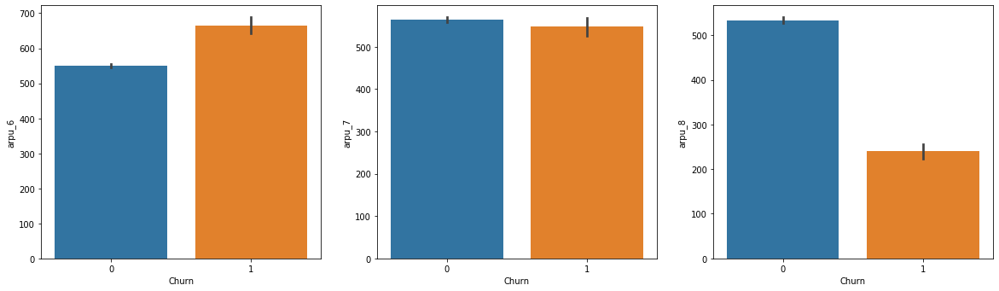

In [512]:
#Create Bar Plot
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'Churn', y = 'arpu_6', data = telecom_hv)
plt.subplot(2,3,2)
plt.ylabel('Av Rev. Month 7')
sns.barplot(x = 'Churn', y = 'arpu_7', data = telecom_hv)
plt.subplot(2,3,3)
plt.ylabel('Av Rev. Month 8')
sns.barplot(x = 'Churn', y = 'arpu_8', data = telecom_hv)


##### The Average Revenue per user metric Drop in month 8 indicates Churn

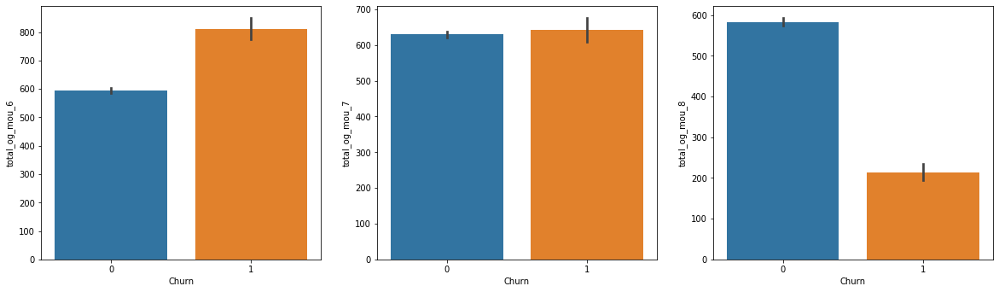

In [513]:
#Create Bar Plot
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'Churn', y = 'total_og_mou_6', data = telecom_hv)
plt.subplot(2,3,2)
sns.barplot(x = 'Churn', y = 'total_og_mou_7', data = telecom_hv)
plt.subplot(2,3,3)
sns.barplot(x = 'Churn', y = 'total_og_mou_8', data = telecom_hv)


#### The Outgoing minutes Drop in month 8 indicates Churn

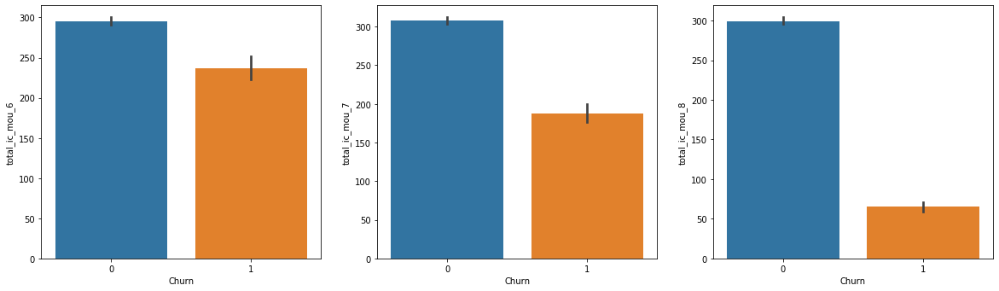

In [514]:
#Create Bar Plot
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'Churn', y = 'total_ic_mou_6', data = telecom_hv)
plt.subplot(2,3,2)
sns.barplot(x = 'Churn', y = 'total_ic_mou_7', data = telecom_hv)
plt.subplot(2,3,3)
sns.barplot(x = 'Churn', y = 'total_ic_mou_8', data = telecom_hv)


#### The Incoming minutes usage Drop in month 8 indicates Churn

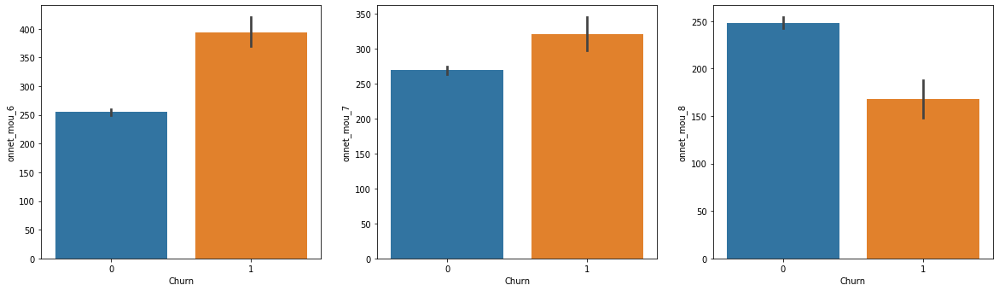

In [515]:
#Create Bar Plot
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'Churn', y = 'onnet_mou_6', data = telecom_hv)
plt.subplot(2,3,2)
sns.barplot(x = 'Churn', y = 'onnet_mou_7', data = telecom_hv)
plt.subplot(2,3,3)
sns.barplot(x = 'Churn', y = 'onnet_mou_8', data = telecom_hv)


#### The Same Operator/network Calls Drop in month 8 indicates Churn

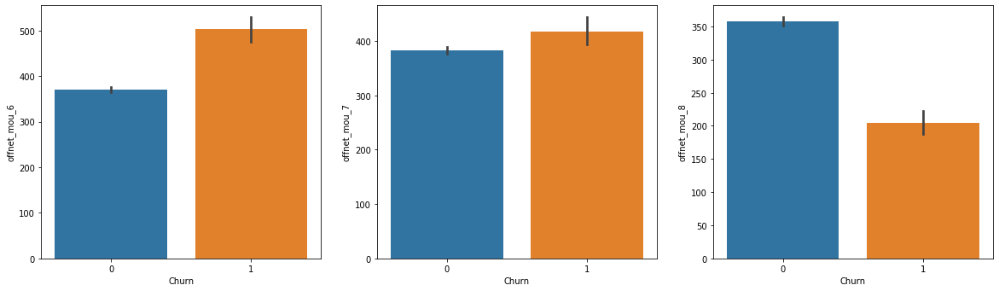

In [516]:
#Create Bar Plot
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'Churn', y = 'offnet_mou_6', data = telecom_hv)
plt.subplot(2,3,2)
sns.barplot(x = 'Churn', y = 'offnet_mou_7', data = telecom_hv)
plt.subplot(2,3,3)
sns.barplot(x = 'Churn', y = 'offnet_mou_8', data = telecom_hv)


#### The Different operator/network Calls Drop in month 8 indicates Churn
#### It would benefit if we Merge the months 6 and 7 into an average number indicating Good Phase

In [517]:
telecom_hv.shape

(29902, 154)

#### Extract all other columns separately for Plotting the correlation and observing highly correlated variables
#### Different metrics include Totals, Amounts, Minutes of Usage, OFFNET & ONNNET, 2g and 3g Data sets

In [518]:
rech_data = telecom_hv.loc[:,telecom_hv.columns.str.contains('rech')]
tot_data = telecom_hv.loc[:,telecom_hv.columns.str.contains('tot')]
amt_data = telecom_hv.loc[:,telecom_hv.columns.str.contains('amt')]
ic_mou_data = telecom_hv.loc[:,(telecom_hv.columns.str.contains('ic') & telecom_hv.columns.str.contains('mou'))]
og_mou_data = telecom_hv.loc[:,(telecom_hv.columns.str.contains('og') & telecom_hv.columns.str.contains('mou'))]
net_mou_data = telecom_hv.loc[:,telecom_hv.columns.str.contains('net_mou')]
data3g = telecom_hv.loc[:,(telecom_hv.columns.str.contains('3g'))]
data2g = telecom_hv.loc[:,(telecom_hv.columns.str.contains('2g'))]

In [519]:
rech_data.shape

(29902, 25)

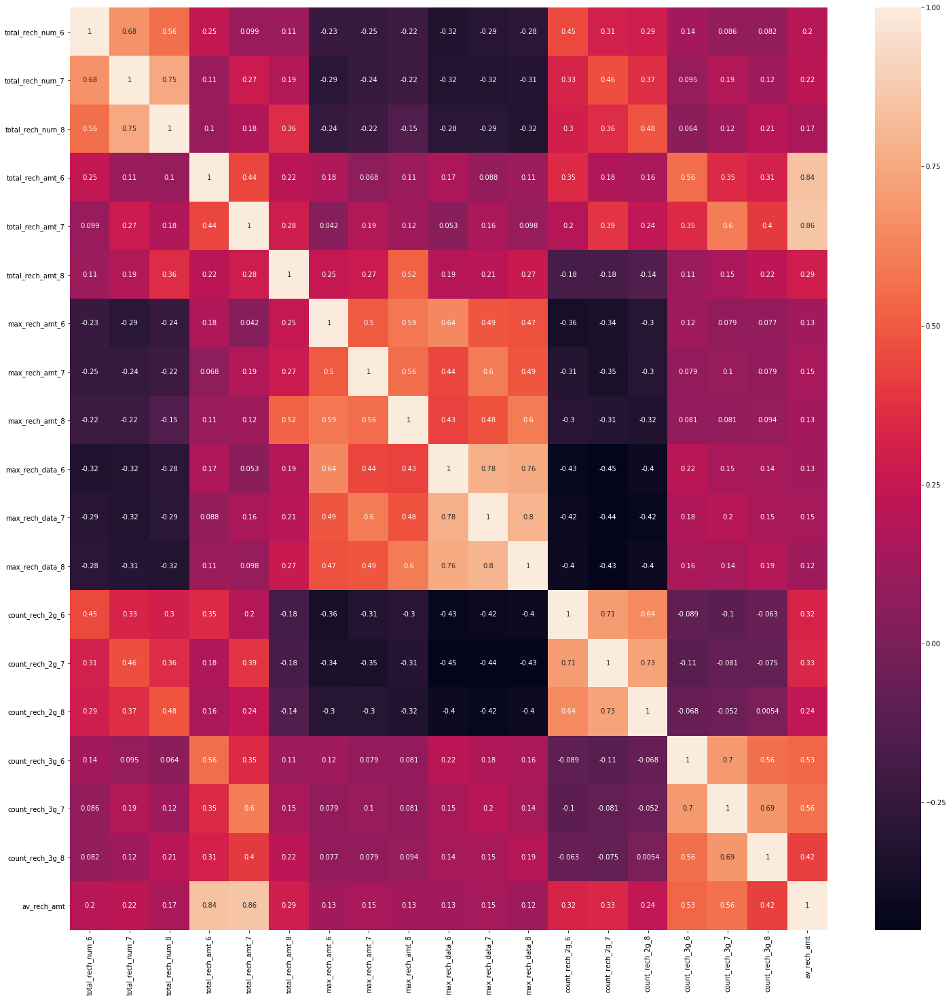

In [520]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (25,25))
sns.heatmap(rech_data.corr(),annot = True)

#### Observations
- High correlation between Average Recharge Amount and Rechage amounts for 6 and 7
- This is expected as the recharge amount is calculated for purpose of filtering high value customers
- There is high correlation 80% between data recharge for month 7 and recharge for month 8. 
- Any factor that has correlation with month 8 is probably correlated to the churn prediction

In [521]:
tot_data.shape

(29902, 12)

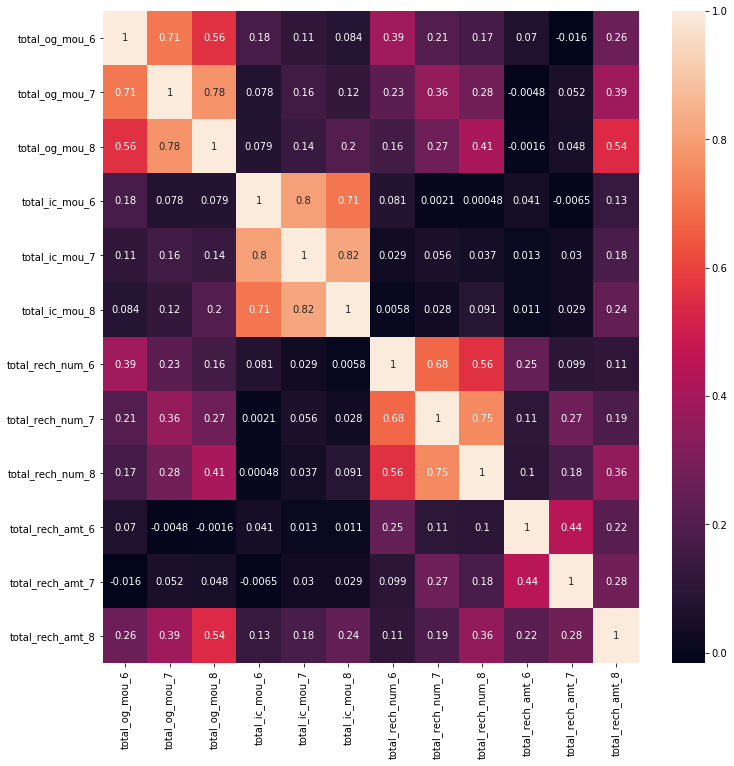

In [522]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (12,12))
sns.heatmap(tot_data.corr(),annot = True)

#### Observations
- There is greater than 70% and some cases 82% correlation between months 7 and 8 regarding Incoming & Outgoing minutes of usage
- This is probabaly due to the fact that if there is heavy usage in month 7 then subsequently in month 8 there is also heavy usage - The cusotmer will not churn if there is heavy usage and vice versa

In [523]:
amt_data.shape

(29902, 10)

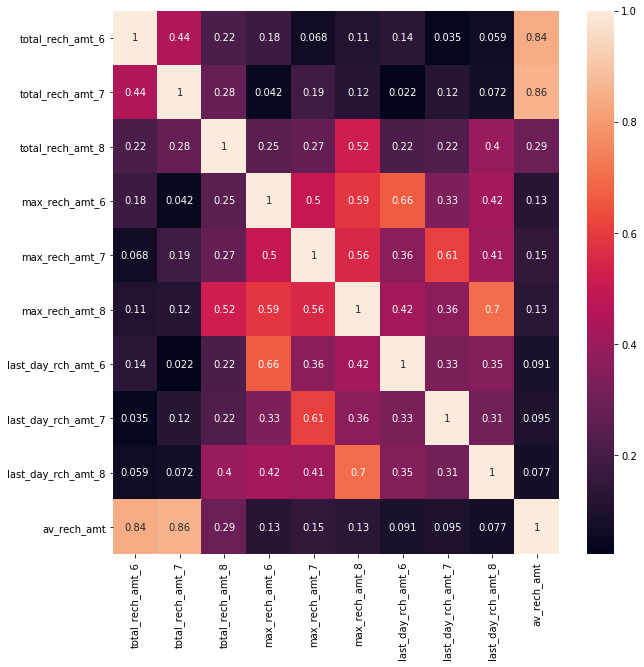

In [524]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (10,10))
sns.heatmap(amt_data.corr(),annot = True)

#### Observations
- Some of this correlation is the same as the First Recharge Amount correlation
- There is also higher correlation between the Max Recharge Amount in month 8 (Bad Phase) and the Last Day Recharge Amount
- This could indicate that if a customer is not going to Churn then they Recharge for a higher amount in month 8 

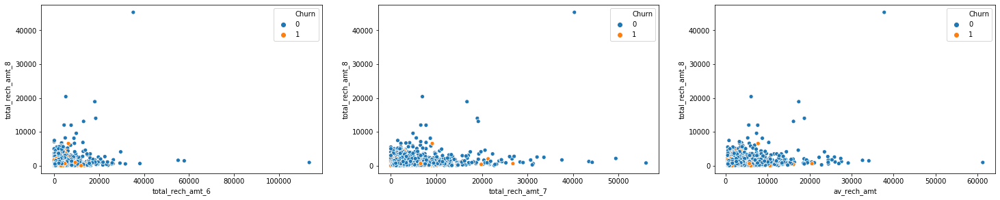

In [525]:
#Create scatter plot to understand distribution of amounts
plt.figure(figsize=(25, 10))
plt.subplot(2,3,1)
sns.scatterplot(x = 'total_rech_amt_6', y = 'total_rech_amt_8', data = telecom_hv, hue = 'Churn')
plt.subplot(2,3,2)
sns.scatterplot(x = 'total_rech_amt_7', y = 'total_rech_amt_8', data = telecom_hv, hue = 'Churn')
plt.subplot(2,3,3)
sns.scatterplot(x = 'av_rech_amt', y = 'total_rech_amt_8', data = telecom_hv, hue = 'Churn')

In [526]:
ic_mou_data.shape

(29902, 36)

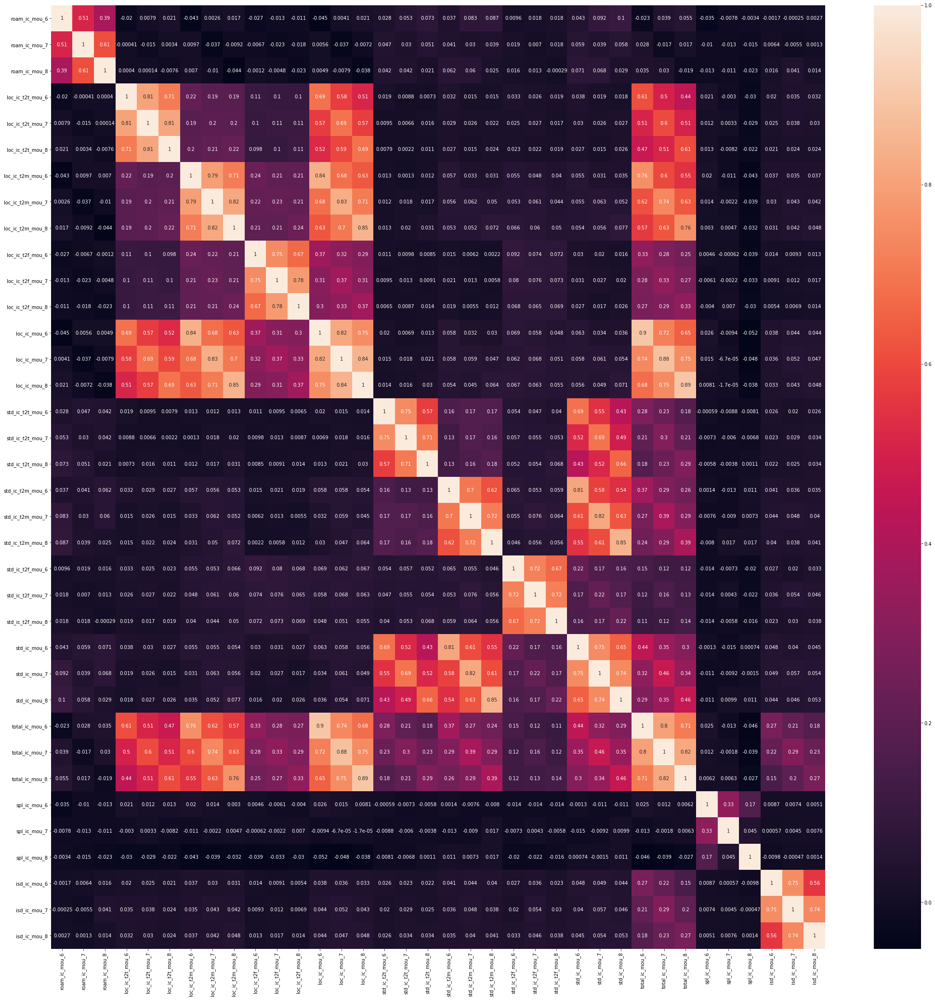

In [527]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (36,36))
sns.heatmap(ic_mou_data.corr(),annot = True)

#### Observations

- Total Incoming minutes of usage is almost entirely explained by the LOCAL call usage and not a lot by the STD calls
- Total Incoming minutes of usage of month 8 is also correlated to the month 7. Indicating that if a customer has High MOU in       month 7 then they will continue to have High MOU in month 8
- The STD Incoming MOU is fully explained by the T2M Minutes of Usage
- High Correlation between Incoming T2T Usage for Months 6 and 7 and Months 7 and 8

In [528]:
og_mou_data.shape

(29902, 39)

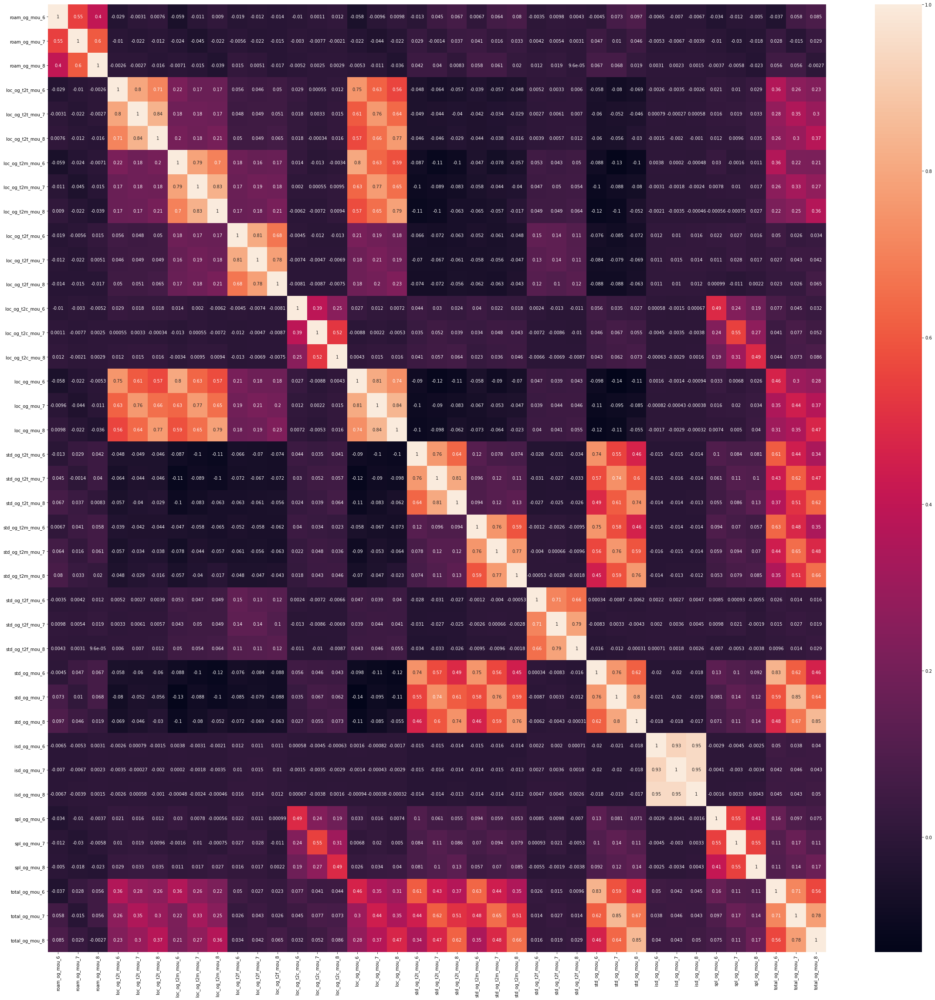

In [529]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (40,40))
sns.heatmap(og_mou_data.corr(),annot = True)

#### Observations

- Total outgoing minutes of usage is almost entirely explained by the Std calls usage and not a lot by the Local calls
- Total Outgoing minutes of usage of month 8 is also correlated to the month 7. Indicating that if a customer has High MOU in       month 7 then they will continue to have High MOU in month 8
- The STD Outgoing MOU is highly correlated to the T2T Minutes of Usage
- High Correlation between OutGoing T2T Usage for Months 6 and 7 and Months 7 and 8

In [530]:
net_mou_data.shape


(29902, 6)

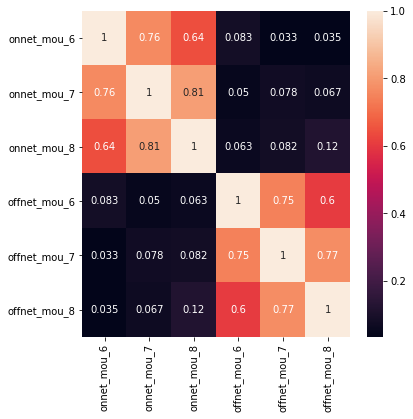

In [531]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (6,6))
sns.heatmap(net_mou_data.corr(),annot = True)

#### Observations

- No Correlation between ONNET and OFFNET Minutes of usage
- High correlation between months 7 and 8 both for ONNET and OFFNET usage

In [532]:
data3g.shape

(29902, 18)

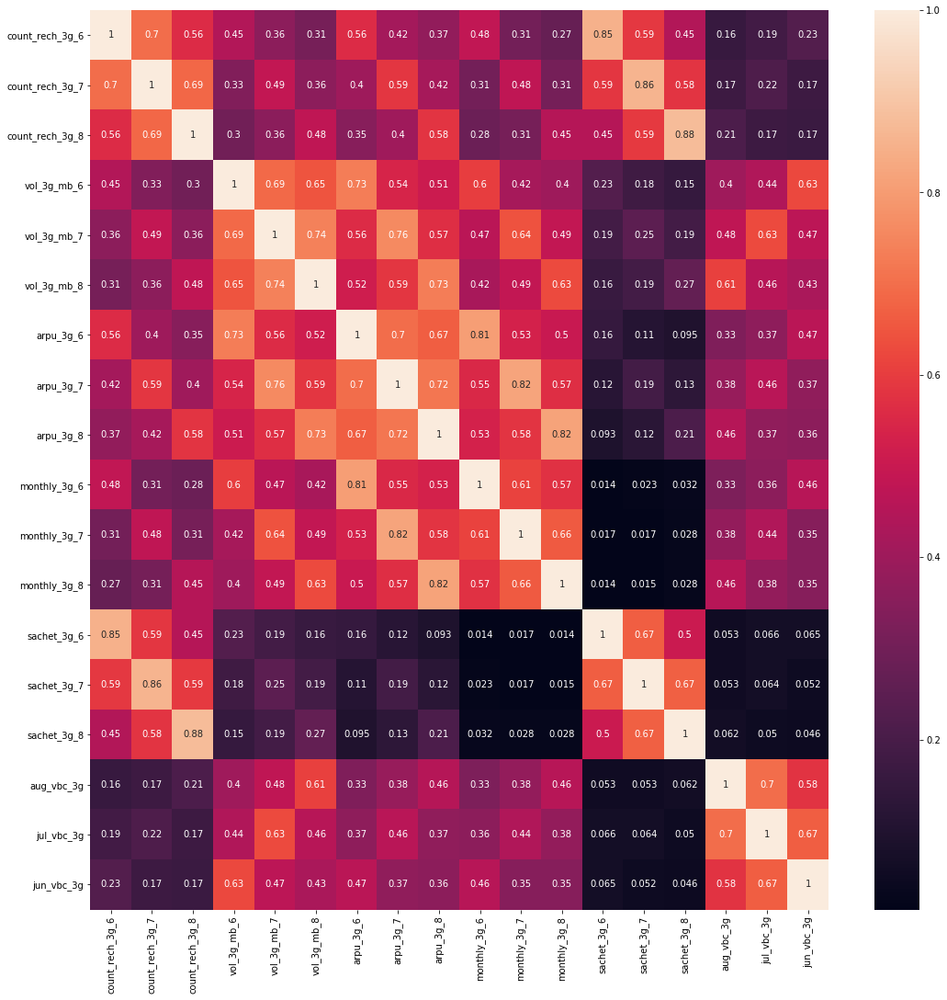

In [533]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (18,18))
sns.heatmap(data3g.corr(),annot = True)

#### Observations

- 70% correlation between Average revenue per user and the 3G Volume of data usage for all Months

In [534]:
data2g.shape

(29902, 15)

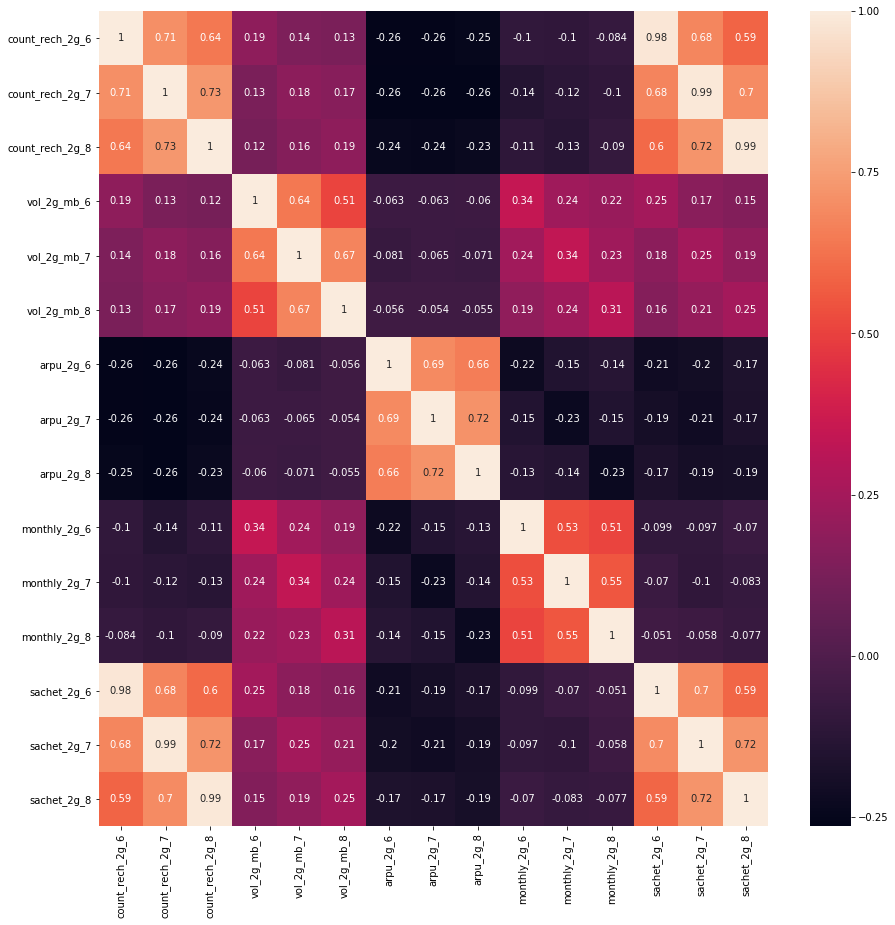

In [535]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (15,15))
sns.heatmap(data2g.corr(),annot = True)

#### Observations

- Very High correlation between the Recharge Sachets and the Count of Recharges for all months

#### Consider dropping columns where most of the values are 0 i.e. Greater than 75% 

In [536]:
check_cols = (telecom_hv[telecom_hv == 0].count(axis=0)/len(telecom_hv.index)*100)
check_cols = check_cols[check_cols > 75].index
check_cols

Index(['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6',
       'roam_og_mou_7', 'roam_og_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'isd_og_mou_6', 'isd_og_mou_7',
       'isd_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8',
       'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6',
       'isd_ic_mou_7', 'isd_ic_mou_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
       'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'Churn'],
      dtype='object')

In [537]:
check_cols = check_cols[check_cols != 'Churn']

##### Numeric Features

In [538]:
telecom_n = telecom_hv.select_dtypes(include=np.number)

In [539]:
telecom_n.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,av_rech_amt,Churn
0,7000842753,197.38,214.82,213.80,nan,nan,0.00,nan,nan,0.00,...,0,1.00,1.00,1.00,968,30.40,0.00,101.20,559.00,1
7,7000701601,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,...,0,nan,nan,nan,802,57.74,19.38,18.74,1185.00,1
8,7001524846,378.72,492.22,137.36,413.69,351.03,35.08,94.66,80.63,136.48,...,0,nan,1.00,1.00,315,21.03,910.65,122.16,696.00,0
21,7002124215,514.45,597.75,637.76,102.41,132.11,85.14,757.93,896.68,983.39,...,0,nan,nan,nan,720,0.00,0.00,0.00,640.00,0
23,7000887461,74.35,193.90,366.97,48.96,50.66,33.58,85.41,89.36,205.89,...,1,nan,1.00,1.00,604,40.45,51.86,0.00,583.00,0


In [540]:
telecom_n.shape

(29902, 148)

#### If there are any NAN values then fill them with 0

In [574]:
# Columns with more than 70% missing values
colmns_missing_data = round(100*(telecom_n.isnull().sum()/len(telecom_n.index)), 2)
cols = colmns_missing_data[colmns_missing_data>1]

In [575]:
cols

Series([], dtype: float64)

In [546]:
telecom_cat = pd.DataFrame(telecom_n,columns = ['mobile_number','night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8'])
telecom_n.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8'],axis=1,inplace=True)


In [547]:
telecom_cat.shape


(29902, 7)

In [548]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, verbose=0)
imp.fit(telecom_n)
imputed_df = imp.transform(telecom_n)

In [551]:
# Columns with more than 70% missing values
new_df = pd.DataFrame(imputed_df)
new_df.columns = telecom_n.columns
new_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,av_rech_amt,Churn
0,7000842753.00,197.38,214.82,213.80,-77.35,-39.47,0.00,359.77,354.74,0.00,...,1.00,0.00,0.00,0.00,968.00,30.40,0.00,101.20,559.00,1.00
1,7000701601.00,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,...,0.00,0.00,0.00,0.00,802.00,57.74,19.38,18.74,1185.00,1.00
2,7001524846.00,378.72,492.22,137.36,413.69,351.03,35.08,94.66,80.63,136.48,...,0.00,0.00,0.00,0.00,315.00,21.03,910.65,122.16,696.00,0.00
3,7002124215.00,514.45,597.75,637.76,102.41,132.11,85.14,757.93,896.68,983.39,...,0.00,0.00,0.00,0.00,720.00,0.00,0.00,0.00,640.00,0.00
4,7000887461.00,74.35,193.90,366.97,48.96,50.66,33.58,85.41,89.36,205.89,...,1.00,0.00,0.00,1.00,604.00,40.45,51.86,0.00,583.00,0.00


In [557]:
telecom_n = pd.merge(new_df, telecom_cat, on='mobile_number', how='inner')
telecom_n.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,jul_vbc_3g,jun_vbc_3g,av_rech_amt,Churn,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
0,7000842753.00,197.38,214.82,213.80,-77.35,-39.47,0.00,359.77,354.74,0.00,...,0.00,101.20,559.00,1.00,0.00,0.00,0.00,1.00,1.00,1.00
1,7000701601.00,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,...,19.38,18.74,1185.00,1.00,nan,nan,nan,nan,nan,nan
2,7001524846.00,378.72,492.22,137.36,413.69,351.03,35.08,94.66,80.63,136.48,...,910.65,122.16,696.00,0.00,nan,0.00,0.00,nan,1.00,1.00
3,7002124215.00,514.45,597.75,637.76,102.41,132.11,85.14,757.93,896.68,983.39,...,0.00,0.00,640.00,0.00,nan,nan,nan,nan,nan,nan
4,7000887461.00,74.35,193.90,366.97,48.96,50.66,33.58,85.41,89.36,205.89,...,51.86,0.00,583.00,0.00,nan,0.00,0.00,nan,1.00,1.00


In [553]:
pd.DataFrame(telecom_n,columns = telecom_cat.columns)

,mobile_number,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
0,7000842753,0.00,0.00,0.00,1.00,1.00,1.00
1,7000701601,nan,nan,nan,nan,nan,nan
2,7001524846,nan,0.00,0.00,nan,1.00,1.00
3,7002124215,nan,nan,nan,nan,nan,nan
4,7000887461,nan,0.00,0.00,nan,1.00,1.00
5,7000149764,1.00,1.00,0.00,1.00,1.00,1.00
6,7000815202,nan,nan,nan,nan,nan,nan
7,7000721289,nan,nan,nan,nan,nan,nan
8,7000294396,nan,nan,nan,nan,nan,nan
9,7002188521,0.00,0.00,0.00,1.00,0.00,0.00


##### Non Numeric Variables

In [560]:
telecom_nn = telecom_hv.select_dtypes(exclude=telecom_n.dtypes)

In [561]:
telecom_nn.head()

,mobile_number,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,...,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,Churn
0,7000842753,4,3,2,252,252,252,252,6/21/2014,7/16/2014,...,0,0,1,1,1,0,0,0,968,1
7,7000701601,5,5,7,3638,1580,790,1580,6/27/2014,7/25/2014,...,0,0,0,0,0,0,0,0,802,1
8,7001524846,19,21,14,120,90,154,30,6/25/2014,7/31/2014,...,1,3,0,0,0,0,0,0,315,0
21,7002124215,22,26,27,718,50,50,50,6/30/2014,7/31/2014,...,0,0,0,0,0,0,0,0,720,0
23,7000887461,3,5,4,439,0,179,179,6/18/2014,7/7/2014,...,0,0,0,2,1,0,0,1,604,0


#### Since we are not predicting any churn based on the above Date variables - is it safe to drop them? 

### Derived Features based on the Exploratory Data Analysis performed in the previous step
- 1. Average ARPU during months 6 and 7
- 2. Average OG minutes of usage during months 6 and 7
- 3. Average IC Minutes of usage during months 6 and 7
- 4. Average OFFNET and ONNET minutes of usage for months 6 and 7

In [562]:
telecom_n['gp_avg_arpu'] = (telecom_n['arpu_6'] + telecom_n['arpu_7'])/2

- If a Customer is only joining in the Bad Phase assign the same valus to the Good Phase

In [563]:
telecom_n['gp_avg_arpu'] = np.where((telecom_n['arpu_8'] > 0) & (telecom_n['gp_avg_arpu'] == 0),telecom_n['arpu_8'],telecom_n['gp_avg_arpu'])                              

- Drop the individual month ARPU data as it's redundant

In [564]:
telecom_n.drop(['arpu_6','arpu_7'],axis=1,inplace=True)

In [565]:
telecom_n['total_og_mou_gp'] = (telecom_n['total_og_mou_6'] + telecom_n['total_og_mou_7'])/2

In [566]:
telecom_n['total_og_mou_gp'] = np.where((telecom_n['total_og_mou_8'] > 0) & (telecom_n['total_og_mou_gp'] == 0),telecom_n['total_ic_mou_8'],telecom_n['total_og_mou_gp'])                              

- Drop the individual month Outgoing usage data as it's redundant

In [567]:
telecom_n.drop(['total_og_mou_6','total_og_mou_7'],axis=1,inplace=True)

In [568]:
telecom_n['total_ic_mou_gp'] = (telecom_n['total_ic_mou_6'] + telecom_n['total_ic_mou_7'])/2

- If a Customer is only joining in the Bad Phase assign the same valus to the Good Phase

In [569]:
telecom_n['total_ic_mou_gp'] = np.where((telecom_n['total_ic_mou_8'] > 0) & (telecom_n['total_ic_mou_gp'] == 0),telecom_n['total_ic_mou_8'],telecom_n['total_ic_mou_gp'])                              

- Drop the individual incoming usage month data as it's redundant

In [570]:
telecom_n.drop(['total_ic_mou_6','total_ic_mou_7'],axis=1,inplace=True)

In [571]:
telecom_n['onnet_mou_gp'] = (telecom_n['onnet_mou_6'] + telecom_n['onnet_mou_7'])/2
telecom_n['offnet_mou_gp'] = (telecom_n['offnet_mou_6'] + telecom_n['offnet_mou_7'])/2

- Drop the individual ONNET and OFFNET usage month data as it's redundant

In [572]:
telecom_n.drop(['onnet_mou_6','onnet_mou_7','offnet_mou_6','offnet_mou_7'],axis=1,inplace=True)

In [573]:
telecom_n.fillna(0,inplace=True)
telecom_n.shape

(29902, 143)

#### Feature Generation - Introduce new Feature called Retain Factor
- Retain Factor is calculated as the ratio of the Bad phase Average Revenue / Good Phase Average revenue
- And the Ratio of the number of recharges in month 8 Vs Month 7

In [576]:
#telecom_n.dtypes
telecom_n['retain_factor_arpu'] = round(telecom_n['arpu_8'] / telecom_n['gp_avg_arpu'],2)
telecom_n['retain_factor_rech'] = round(telecom_n['total_rech_num_8'] / telecom_n['total_rech_num_7'],2)
telecom_n['retain_factor_rech'] = np.where(telecom_n['retain_factor_rech'] > 1,1,telecom_n['retain_factor_rech'])
telecom_n['retain_factor_arpu'] = np.where(telecom_n['retain_factor_arpu'] > 1,1,telecom_n['retain_factor_arpu'])

In [577]:
#Deduce a factor for retaining the customer
telecom_n['retain_factor'] = np.where((telecom_n['retain_factor_arpu'] > 0.5) & (telecom_n['retain_factor_rech'] > 0.5),0,1)
telecom_n.drop(columns = ['retain_factor_rech','retain_factor_arpu'], axis=1, inplace=True)

## Perform PCA and Predict Churn

In [578]:
from sklearn.model_selection import train_test_split
# Assign feature variable to X
X = telecom_n.drop(['Churn','mobile_number'],axis=1)
# Assign response variable to y
y = telecom_n['Churn']
y.head()

0   1.00
1   1.00
2   0.00
3   0.00
4   0.00
Name: Churn, dtype: float64

### Feature Standardisation

In [579]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

scaler = preprocessing.StandardScaler().fit(X)
XScale = scaler.transform(X)

In [580]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(XScale,y, train_size=0.7,test_size=0.3,random_state=100)

In [581]:
X_train.shape

(20931, 142)

### Understand the data imbalance

In [582]:
y_train_imb = (y_train != 0).sum()/(y_train == 0).sum()
y_test_imb = (y_test != 0).sum()/(y_test == 0).sum()
print("Imbalance in Train Data:", y_train_imb)
print("Imbalance in Test Data:", y_test_imb)

Imbalance in Train Data: 0.08704232666839781
Imbalance in Test Data: 0.0856831659203679


Text(0.5, 0, 'Churn')

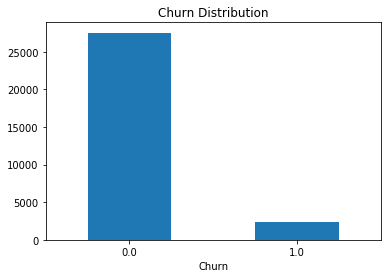

In [583]:
count_class = pd.value_counts(telecom_n['Churn'], sort=True)
count_class.plot(kind='bar',rot = 0)
plt.title('Churn Distribution')
plt.xlabel('Churn')

#### Handle data imbalance by Performing SMOTE oversampling on the data set


In [584]:
### Other Sampling Techniques just for playing around
#from imblearn.combine import SMOTETomek
#from imblearn.under_sampling import NearMiss
#smk = SMOTETomek(random_state = 42)
#X_trainb,y_trainb = smk.fit_sample(X_train,y_train)

In [585]:
### Other Sampling Techniques just for playing around
#from imblearn.over_sampling import RandomOverSampler
#os = RandomOverSampler(sampling_strategy=1)
#X_trainb,y_trainb = os.fit_sample(X_train,y_train)

In [586]:
from imblearn.over_sampling import SMOTE

In [587]:
smt = SMOTE(random_state = 2) 
X_trainb,y_trainb = smt.fit_sample(X_train,y_train)

In [588]:
X_trainb.shape

(38510, 142)

In [589]:
y_trainb.shape

(38510,)

In [590]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [591]:
#Doing the PCA on the train data
pca.fit(X_trainb)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [592]:
pca.components_

array([[ 7.20820834e-02, -4.72269687e-02, -1.94685617e-02, ...,
        -1.19469377e-01, -8.81171399e-02, -5.25091398e-02],
       [ 1.96422308e-01,  1.38745228e-01,  1.22428824e-01, ...,
         1.27217089e-01,  1.57370660e-01, -1.51282189e-01],
       [ 1.24225847e-02,  9.16756586e-03,  7.23500750e-02, ...,
         6.89808926e-02,  1.18287505e-01,  9.14686990e-02],
       ...,
       [ 1.48375372e-07, -2.62223167e-06, -3.30466280e-06, ...,
         7.84046889e-06,  8.75066542e-06,  3.35185915e-08],
       [ 1.24739941e-06,  1.29856701e-05,  1.23281724e-05, ...,
        -1.99689148e-05, -1.93317996e-05, -5.00258721e-07],
       [-0.00000000e+00,  5.35999122e-16,  5.33721983e-16, ...,
        -5.92469158e-16, -8.40729976e-16,  1.06060840e-16]])

In [593]:
colnames = list(X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'PC3':pca.components_[2],'Feature':colnames})
pcs_df.head(10)

,PC1,PC2,PC3,Feature
0,0.07,0.20,0.01,arpu_8
1,-0.05,0.14,0.01,onnet_mou_8
2,-0.02,0.12,0.07,offnet_mou_8
3,0.03,0.01,0.15,roam_ic_mou_6
4,0.03,0.01,0.16,roam_ic_mou_7
5,0.01,-0.03,0.20,roam_ic_mou_8
6,0.00,0.02,0.14,roam_og_mou_6
7,-0.00,0.03,0.14,roam_og_mou_7
8,-0.00,0.05,0.13,roam_og_mou_8
9,0.02,0.07,-0.01,loc_og_t2t_mou_6


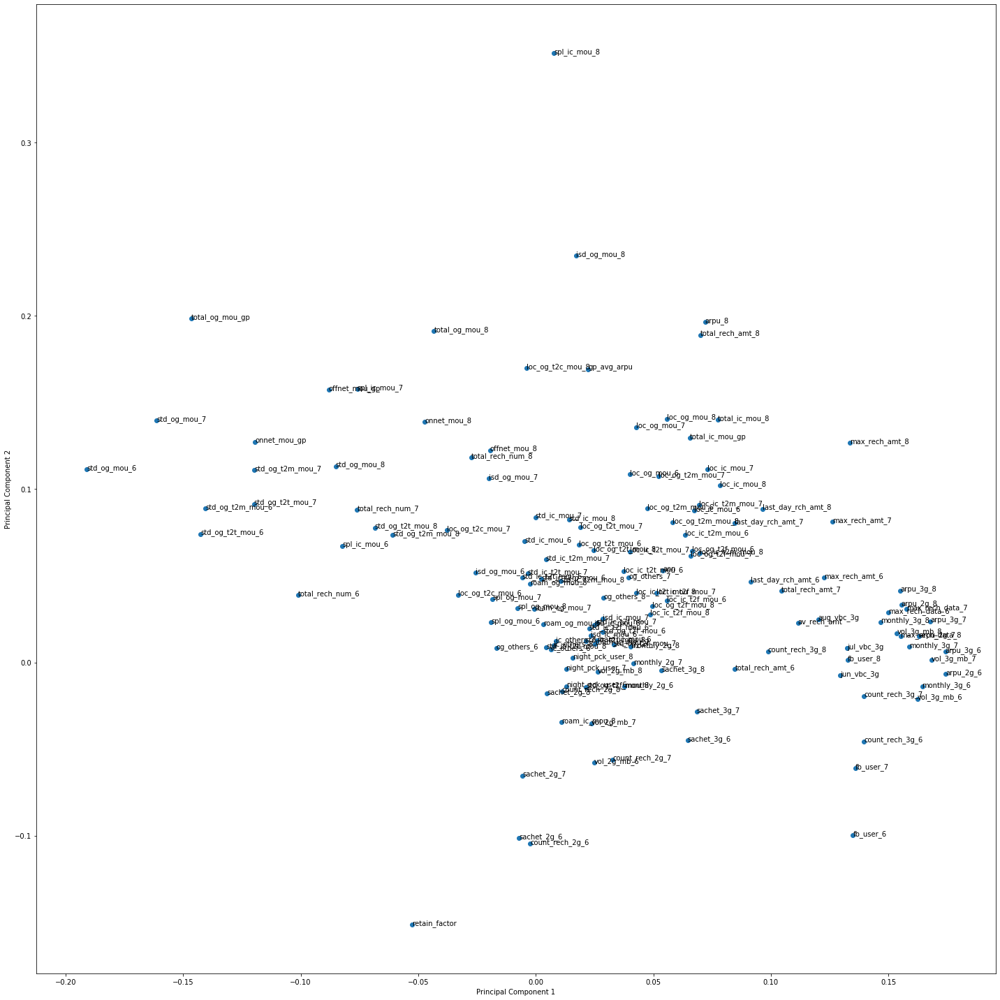

In [594]:
%matplotlib inline
fig = plt.figure(figsize = (20,20))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

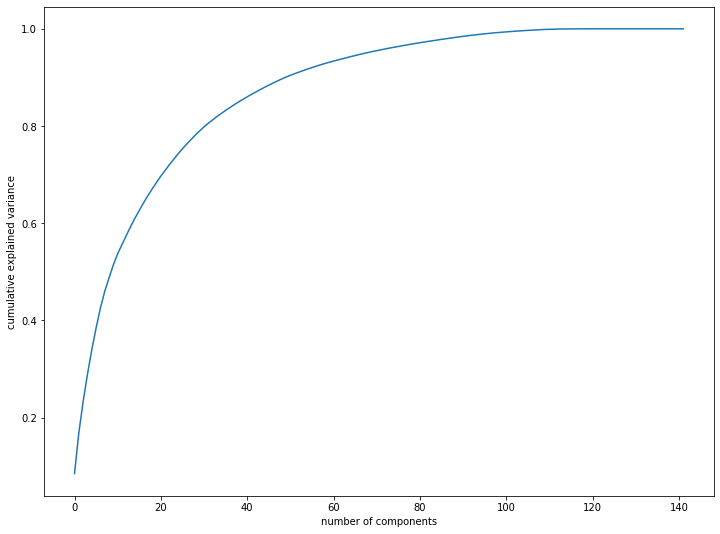

In [595]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,9))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

#### Looks like approx. 50 components are enough to describe 90% of the variance in the dataset
- We'll choose 50 components for our modeling

In [596]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=50)

#### Basis transformation - getting the data onto our PCs


In [597]:
df_train_pca = pca_final.fit_transform(X_trainb)
df_train_pca.shape

(38510, 50)

#### Creating correlation matrix for the principal components - we expect little to no correlation

In [598]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

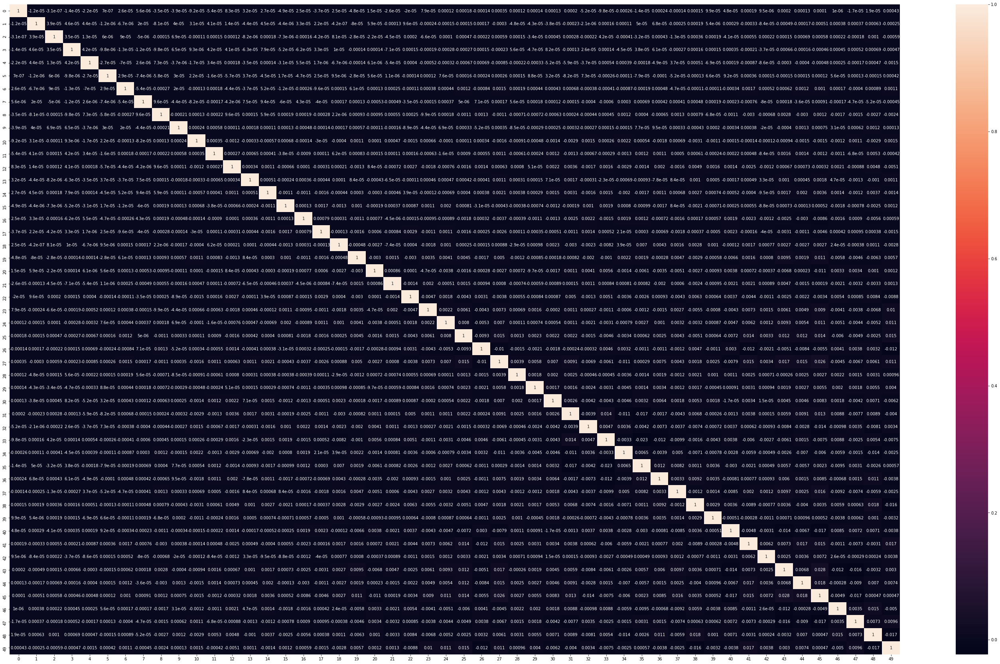

In [599]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (50,30))
sns.heatmap(corrmat,annot = True)

In [600]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.028235237303946937 , min corr:  -0.022974192330987474


#### There is no correlation between any two components! 


In [601]:
#Applying selected components to the test data - 45 components
telecom_test_pca = pca_final.transform(X_test)
telecom_test_pca.shape

(8971, 50)

## Multiple Logistic Regression Models with the Principal Components
#### Model 1 - Use the No. of Principal Components determined by PCA

In [602]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_trainb)

In [603]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(telecom_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.89'

In [604]:
# Predict Results from PCA Model
ypred_pca = model_pca.predict(telecom_test_pca)

In [605]:
# Confusion matrix 
confusion_PCA = metrics.confusion_matrix(y_test, ypred_pca)
print(confusion_PCA)

[[7042 1221]
 [ 149  559]]


In [606]:
from sklearn.metrics import classification_report
print(classification_report(y_test, ypred_pca))

              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      8263
         1.0       0.31      0.79      0.45       708

    accuracy                           0.85      8971
   macro avg       0.65      0.82      0.68      8971
weighted avg       0.93      0.85      0.87      8971



#### Model 2 - Let PCA Choose the number of Principal Components explaining 90% of Variance

In [607]:
pca_again = PCA(0.90)

In [608]:
df_train_pca2 = pca_again.fit_transform(X_trainb)
df_train_pca2.shape
# we see that PCA selected 38 components

(38510, 50)

In [609]:
#training the regression model
learner_pca2 = LogisticRegression()
model_pca2 = learner_pca2.fit(df_train_pca2,y_trainb)

In [610]:
df_test_pca2 = pca_again.transform(X_test)
df_test_pca2.shape

(8971, 50)

In [611]:
#Making prediction on the test data
pred_probs_test2 = model_pca2.predict_proba(df_test_pca2)[:,1]
"{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test2))

'0.89'

In [612]:
# Predict Results from PCA Model
ypred_pca2 = model_pca2.predict(df_test_pca2)

In [613]:
# Confusion matrix 
confusion_PCA = metrics.confusion_matrix(y_test, ypred_pca2)
print(confusion_PCA)

[[7032 1231]
 [ 154  554]]


In [614]:
from sklearn.metrics import classification_report
print(classification_report(y_test, ypred_pca2))

              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      8263
         1.0       0.31      0.78      0.44       708

    accuracy                           0.85      8971
   macro avg       0.64      0.82      0.68      8971
weighted avg       0.93      0.85      0.87      8971



#### Model 3 - Let PCA Choose the number of Principal Components explaining 95% of Variance

In [615]:
pca_again = PCA(0.95)

In [616]:
df_train_pca3 = pca_again.fit_transform(X_trainb)
df_train_pca3.shape
# we see that PCA selected 51 components

(38510, 69)

In [617]:
#training the regression model
learner_pca3 = LogisticRegression()
model_pca3 = learner_pca3.fit(df_train_pca3,y_trainb)

In [618]:
df_test_pca3 = pca_again.transform(X_test)
df_test_pca3.shape

(8971, 69)

In [619]:
#Making prediction on the test data
pred_probs_test3 = model_pca3.predict_proba(df_test_pca3)[:,1]
"{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test3))

'0.89'

In [620]:
# Predict Results from PCA Model
ypred_pca3 = model_pca3.predict(df_test_pca3)

In [621]:
# Confusion matrix 
confusion_PCA = metrics.confusion_matrix(y_test, ypred_pca3)
print(confusion_PCA)

[[7042 1221]
 [ 148  560]]


In [622]:
from sklearn.metrics import classification_report
print(classification_report(y_test, ypred_pca3))

              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      8263
         1.0       0.31      0.79      0.45       708

    accuracy                           0.85      8971
   macro avg       0.65      0.82      0.68      8971
weighted avg       0.93      0.85      0.87      8971



## PCA Model with Logistic Regression Conclusions
- PCA way of selecting variables is simple and easy
- We choose Model1 using 50 components as the best fit model due to the Confusion Matrix and the Accuracy Scores
- The False Positives are still quite High

- **Confusion Matrix for Model 1**

   6818     1445

   137      571
   
   
- **Model Accuracy**

    88%
 
- **Classification Report for Model 1**

               precision    recall  f1-score   support

           0       0.98      0.83      0.90      8263
           1       0.28      0.81      0.42       708

   
 

#### Visualize the data to see if we can spot any patterns

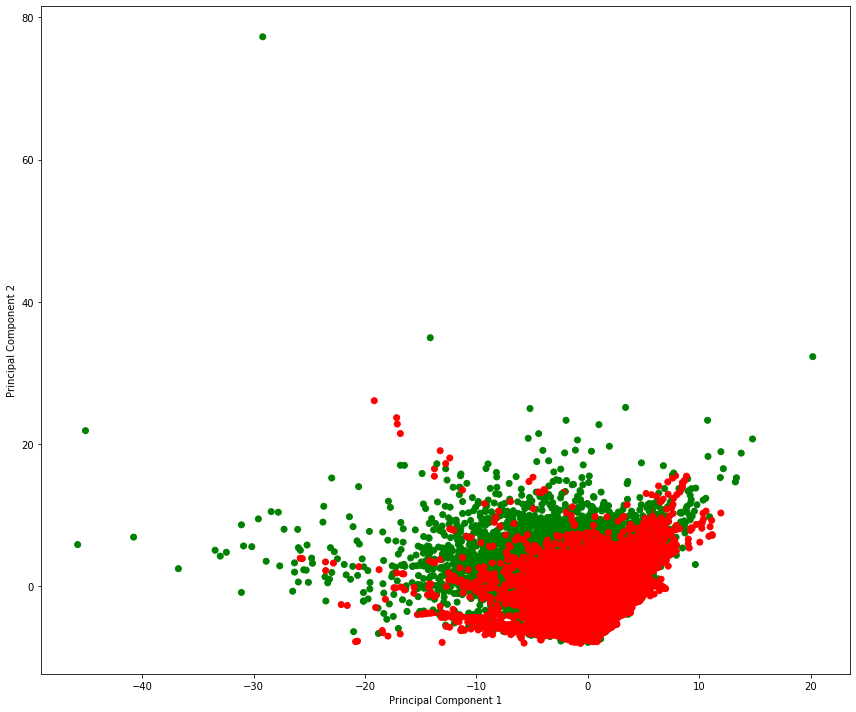

In [623]:
%matplotlib inline
fig = plt.figure(figsize = (12,10))
plt.scatter(df_train_pca[:,0], df_train_pca[:,1], c = y_trainb.map({0:'green',1:'red'}))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.tight_layout()
plt.show()

#### PCA with 10 Principal Components just to illustrate the difference
- Model 4

In [624]:
pca_last = PCA(n_components=10)
df_train_pca4 = pca_last.fit_transform(X_trainb)
df_test_pca4 = pca_last.transform(X_test)
df_test_pca4.shape

(8971, 10)

In [625]:
#training the regression model
learner_pca4 = LogisticRegression()
model_pca4 = learner_pca4.fit(df_train_pca4,y_trainb)
#Making prediction on the test data
pred_probs_test4 = model_pca4.predict_proba(df_test_pca4)[:,1]
"{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test4))

'0.87'

#### We get good results with the Chosen Principal components and almost close to it with just 10 Principal Components.

### Logistic Regression Algorithm with RFE

In [626]:
# Create a copy
telecom_LR_wPCA = telecom_n.copy()

In [627]:
telecom_LR_wPCA.shape

(29902, 144)

In [628]:
telecom_LR_wPCA['Churn'].value_counts()

0.00    27518
1.00     2384
Name: Churn, dtype: int64

Text(0.5, 1.0, 'Churn status Distribution')

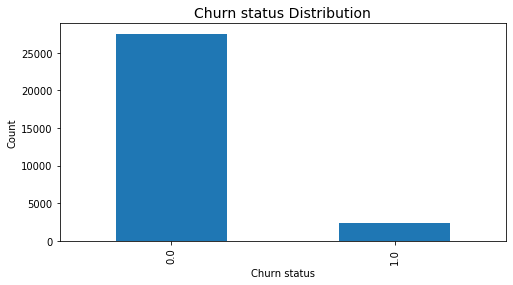

In [629]:
plt.figure(figsize=(8,4))
telecom_LR_wPCA['Churn'].value_counts().plot(kind = 'bar')
plt.ylabel('Count')
plt.xlabel('Churn status')
plt.title('Churn status Distribution',fontsize=14)

In [630]:
# Create correlation matrix and check correlation greater than 0.95 adn drop those columns
corr_matrix = telecom_LR_wPCA.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

In [631]:
print(to_drop)

['total_rech_amt_8', 'sachet_2g_6', 'sachet_2g_8']


In [632]:
# Drop high correlated features
telecom_LR_wPCA.drop(telecom_LR_wPCA[to_drop], axis=1, inplace=True)

In [633]:
telecom_LR_wPCA.shape

(29902, 141)

#### Feature Generation - Introduce new Feature called Retain Factor
- Retain Factor is calculated as the ratio of the Bad phase Average Revenue / Good Phase Average revenue
- And the Ratio of the number of recharges in month 8 Vs Month 7

In [634]:
#telecom_LR_wPCA.dtypes
telecom_LR_wPCA['retain_factor_arpu'] = round(telecom_LR_wPCA['arpu_8'] / telecom_LR_wPCA['gp_avg_arpu'],2)
telecom_LR_wPCA['retain_factor_rech'] = round(telecom_LR_wPCA['total_rech_num_8'] / telecom_LR_wPCA['total_rech_num_7'],2)
telecom_LR_wPCA['retain_factor_rech'] = np.where(telecom_LR_wPCA['retain_factor_rech'] > 1,1,telecom_LR_wPCA['retain_factor_rech'])
telecom_LR_wPCA['retain_factor_arpu'] = np.where(telecom_LR_wPCA['retain_factor_arpu'] > 1,1,telecom_LR_wPCA['retain_factor_arpu'])

- If the Ratio between the ARPU for the bad phase and the good phase is > than 0.6
  and if the Ratio of the Number of recharges is > 0.6 
- Then the consideration is that if the customer retention ratio is High then the user is likely not to Churn

In [635]:
#Deduce a factor for retaining the customer
telecom_LR_wPCA['retain_factor'] = np.where((telecom_LR_wPCA['retain_factor_arpu'] > 0.6) & (telecom_LR_wPCA['retain_factor_rech'] > 0.6),0,1)
telecom_LR_wPCA.drop(columns = ['retain_factor_rech','retain_factor_arpu'], axis=1, inplace=True)

In [636]:
telecom_LR_wPCA.retain_factor.describe()

count   29902.00
mean        0.38
std         0.48
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         1.00
Name: retain_factor, dtype: float64

In [808]:
# Assign feature variable to X
X = telecom_LR_wPCA.drop(['Churn','mobile_number'],axis=1)
X.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,...,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8,gp_avg_arpu,total_og_mou_gp,total_ic_mou_gp,onnet_mou_gp,offnet_mou_gp,retain_factor
0,213.80,0.00,0.00,53.27,40.49,0.00,22.91,11.73,0.00,55.61,...,0.00,1.00,1.00,1.00,206.10,0.00,5.44,-58.41,357.25,0
1,3171.48,52.29,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,...,0.00,0.00,0.00,0.00,1209.51,548.38,592.25,56.26,510.29,0
2,137.36,35.08,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,...,0.00,0.00,1.00,1.00,435.47,470.01,66.17,382.36,87.64,1
3,637.76,85.14,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,...,0.00,0.00,0.00,0.00,556.10,944.57,169.49,117.26,827.30,0
4,366.97,33.58,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,...,0.00,0.00,1.00,1.00,134.12,137.21,171.23,49.81,87.38,0


In [809]:
# Assign the response variable to y
y_LR = telecom_LR_wPCA['Churn']
y_LR.head()

0   1.00
1   1.00
2   0.00
3   0.00
4   0.00
Name: Churn, dtype: float64

In [810]:
# Splitting the data into train and test
X_train_LR, X_test_LR, y_train_LR, y_test_LR = train_test_split(X, y_LR, train_size=0.7, test_size=0.3, random_state=100)

In [811]:
X_train_LR.shape

(20931, 139)

### Balance data set by oversampling

In [812]:
smt = SMOTE(random_state = 2) 
X_train_LR,y_train_LR = smt.fit_sample(X_train_LR,y_train_LR)

In [813]:
X_train_LR.shape

(38510, 139)

In [814]:
data_imbalance = (y_train_LR != 0).sum()/(y_train_LR == 0).sum()
print("Imbalance in Train Data: {}".format(data_imbalance))

Imbalance in Train Data: 1.0


In [815]:
X_train_LR.head()
columns = X_train_LR.columns

In [816]:
y_train_LR.shape

(38510,)

In [817]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_LR[columns] = scaler.fit_transform(X_train_LR[columns])
X_train_LR.retain_factor.describe()

count   38510.00
mean       -0.00
std         1.00
min        -1.10
25%        -1.10
50%         0.91
75%         0.91
max         0.91
Name: retain_factor, dtype: float64

In [818]:
X_train_LR.retain_factor.describe()

count   38510.00
mean       -0.00
std         1.00
min        -1.10
25%        -1.10
50%         0.91
75%         0.91
max         0.91
Name: retain_factor, dtype: float64

In [819]:
import statsmodels.api as sm

In [820]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

#### Feature Selection Using RFE

In [821]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 45)             # running RFE with 38 variables as output
rfe = rfe.fit(X_train_LR, y_train_LR)

In [822]:
rfe.support_

array([False,  True, False, False, False, False, False, False, False,
        True, False,  True,  True,  True,  True,  True,  True, False,
       False, False, False, False,  True,  True,  True,  True, False,
       False, False,  True, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
        True, False, False, False,  True, False,  True, False, False,
       False, False,  True,  True, False,  True,  True, False, False,
       False, False, False, False, False, False,  True, False, False,
       False,  True, False, False, False, False, False, False, False,
        True,  True, False, False, False, False,  True, False, False,
        True, False,  True,  True, False,  True,  True, False,  True,
       False, False, False,  True, False, False,  True, False, False,
        True, False, False,  True, False, False, False, False, False,
       False,  True, False, False,  True,  True,  True, False, False,
       False, False,

In [823]:
list(zip(X_train_LR.columns, rfe.support_, rfe.ranking_))

[('arpu_8', False, 38),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_8', False, 5),
 ('roam_ic_mou_6', False, 28),
 ('roam_ic_mou_7', False, 8),
 ('roam_ic_mou_8', False, 29),
 ('roam_og_mou_6', False, 72),
 ('roam_og_mou_7', False, 17),
 ('roam_og_mou_8', False, 21),
 ('loc_og_t2t_mou_6', True, 1),
 ('loc_og_t2t_mou_7', False, 54),
 ('loc_og_t2t_mou_8', True, 1),
 ('loc_og_t2m_mou_6', True, 1),
 ('loc_og_t2m_mou_7', True, 1),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', True, 1),
 ('loc_og_t2f_mou_7', True, 1),
 ('loc_og_t2f_mou_8', False, 36),
 ('loc_og_t2c_mou_6', False, 46),
 ('loc_og_t2c_mou_7', False, 20),
 ('loc_og_t2c_mou_8', False, 79),
 ('loc_og_mou_6', False, 55),
 ('loc_og_mou_7', True, 1),
 ('loc_og_mou_8', True, 1),
 ('std_og_t2t_mou_6', True, 1),
 ('std_og_t2t_mou_7', True, 1),
 ('std_og_t2t_mou_8', False, 4),
 ('std_og_t2m_mou_6', False, 60),
 ('std_og_t2m_mou_7', False, 6),
 ('std_og_t2m_mou_8', True, 1),
 ('std_og_t2f_mou_6', False, 57),
 ('std_og_t2f_mou_7', Fal

In [824]:
col = X_train_LR.columns[rfe.support_]

#### Assessing the model with StatsModels

In [825]:
X_train_sm = sm.add_constant(X_train_LR[col])
logm2 = sm.GLM(y_train_LR,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                38510
Model:                            GLM   Df Residuals:                    38464
Model Family:                Binomial   Df Model:                           45
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13629.
Date:                Thu, 02 Jan 2020   Deviance:                       27257.
Time:                        01:52:30   Pearson chi2:                 1.97e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.1238      0.021     -5.849      0.000      -0.165      -0.082
onnet_mou_8            0.8925      0.109      8.159      0.000       0.678       1.107
loc_og_t2t_mou_6       0.2503      0.034      7.410      0.000       0.184       0.316
loc_og_t2t_mou_8      -1.2005      0.257     -4.666      0.000      -1.705      -0.696
loc_og_t2m_mou_6      -0.2669      0.031     -8.598      0.000      -0.328      -0.206
loc_og_t2m_mou_7      -0.3883      0.067     -5.792      0.000      -0.520      -0.257
loc_og_t2m_mou_8      -0.7803      0.292     -2.674      0.007      -1.352      -0.208
loc_og_t2f_mou_6       0.1968      0.035      5.593      0.000       0.128       0.266
loc_og_t2f_mou_7      -0.2852      0.039     -7.226      0.000      -0.363      -0.208
loc_og_mou_7           0.7444      0.079      9.406      0.000       0.589       0.900
loc_og_mou_8           1.5473      0.451      3.429      0.001       0.663       2.432
std_og_t2t_mou_6       0.5114      0.055      9.261      0.000       0.403       0.620
std_og_t2t_mou_7       0.4904      0.055      8.966      0.000       0.383       0.598
std_og_t2m_mou_8       0.8473      0.102      8.293      0.000       0.647       1.048
isd_og_mou_8          -0.4646      0.098     -4.747      0.000      -0.656      -0.273
total_og_mou_8        -2.0543      0.173    -11.843      0.000      -2.394      -1.714
loc_ic_t2m_mou_6       0.2640      0.039      6.777      0.000       0.188       0.340
loc_ic_t2m_mou_8      -0.1795      0.090     -2.002      0.045      -0.355      -0.004
loc_ic_mou_7           0.5070      0.049     10.404      0.000       0.412       0.603
loc_ic_mou_8          -1.4692      0.104    -14.178      0.000      -1.672      -1.266
std_ic_t2t_mou_7       0.2786      0.036      7.808      0.000       0.209       0.349
std_ic_t2t_mou_8      -0.2856      0.056     -5.133      0.000      -0.395      -0.177
std_ic_mou_8          -0.1774      0.033     -5.326      0.000      -0.243      -0.112
spl_ic_mou_8          -1.2067      0.168     -7.193      0.000      -1.536      -0.878
total_rech_num_7       0.4176      0.030     13.801      0.000       0.358       0.477
total_rech_num_8      -0.7026      0.037    -19.063      0.000      -0.775      -0.630
max_rech_amt_8         0.2136      0.028      7.724      0.000       0.159       0.268
last_day_rch_amt_8    -0.5038      0.025    -20.540      0.000      -0.552      -0.456
max_rech_data_7        0.1913      0.026      7.315      0.000       0.140       0.242
max_rech_data_8       -0.6003      0.036    -16.618      0.000      -0.671      -0.529
count_rech_2g_7        0.1840      0.024      7.797      0.000       0.138       0.230
count_rech_2g_8       -0.4219      0.033    -12.974      0.000      -0.486      -0.358
count_rech_3g_7        0.2182      0.0

In [826]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

0   0.99
1   0.07
2   0.32
3   0.11
4   0.09
5   0.65
6   0.67
7   0.50
8   0.93
9   0.03
dtype: float64

In [827]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.99069267, 0.07227367, 0.32136944, 0.10920945, 0.09478204,
       0.64706642, 0.67497789, 0.50305146, 0.93490484, 0.02508632])

In [828]:
###Creating a dataframe with the actual churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train_LR.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['MobileNumber'] = y_train_LR.index
y_train_pred_final.head()

,Churn,Churn_Prob,MobileNumber
0,1.00,0.99,0
1,0.00,0.07,1
2,0.00,0.32,2
3,0.00,0.11,3
4,0.00,0.09,4


#### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [829]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,MobileNumber,predicted
0,1.00,0.99,0,1
1,0.00,0.07,1,0
2,0.00,0.32,2,0
3,0.00,0.11,3,0
4,0.00,0.09,4,0


In [830]:
from sklearn import metrics

In [831]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[16415  2840]
 [ 2686 16569]]


In [832]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8565048039470268


- Training accuracy using RFE is Approx. 0.844

In [833]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [834]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_LR[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_LR[col].values, i) for i in range(X_train_LR[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,loc_og_mou_8,712.12
5,loc_og_t2m_mou_8,289.34
2,loc_og_t2t_mou_8,226.05
14,total_og_mou_8,104.04
22,spl_ic_mou_8,79.53
42,total_og_mou_gp,59.44
0,onnet_mou_8,41.37
12,std_og_t2m_mou_8,35.67
43,offnet_mou_gp,31.55
8,loc_og_mou_7,15.82


In [835]:
#### There are a some variables with very high VIF. It's best to drop these variables as they aren't helping much with prediction and unnecessarily making the model complex.
#### Lets drop all variables that have very high VIF i.e. above 9
col = vif[vif['VIF'] < 9]
col = col.Features

In [836]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train_LR[col])
logm3 = sm.GLM(y_train_LR,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                38510
Model:                            GLM   Df Residuals:                    38479
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Thu, 02 Jan 2020   Deviance:                          inf
Time:                        01:52:59   Pearson chi2:                 4.50e+15
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4213      0.017    -24.945      0.000      -0.454      -0.388
arpu_3g_8              0.3903      0.039     10.032      0.000       0.314       0.467
loc_ic_mou_8          -4.1795      0.102    -41.018      0.000      -4.379      -3.980
loc_og_t2f_mou_7      -0.2142      0.038     -5.652      0.000      -0.289      -0.140
monthly_3g_8          -0.2619      0.035     -7.505      0.000      -0.330      -0.193
loc_ic_t2m_mou_8       2.0646      0.074     27.736      0.000       1.919       2.211
loc_ic_mou_7           0.5743      0.041     14.179      0.000       0.495       0.654
loc_og_t2f_mou_6       0.2144      0.036      5.994      0.000       0.144       0.285
max_rech_data_8       -0.2563      0.032     -8.107      0.000      -0.318      -0.194
total_rech_num_8      -1.0359      0.034    -30.444      0.000      -1.103      -0.969
vol_3g_mb_8           -0.1849      0.031     -5.943      0.000      -0.246      -0.124
loc_og_t2t_mou_6       0.0722      0.017      4.221      0.000       0.039       0.106
gp_avg_arpu            0.3702      0.023     16.368      0.000       0.326       0.414
max_rech_amt_8         0.0608      0.026      2.308      0.021       0.009       0.112
total_rech_num_7       0.4619      0.027     16.906      0.000       0.408       0.516
loc_og_t2m_mou_6      -0.2191      0.019    -11.617      0.000      -0.256      -0.182
loc_ic_t2m_mou_6       0.1711      0.031      5.479      0.000       0.110       0.232
fb_user_8             -0.4637      0.025    -18.785      0.000      -0.512      -0.415
std_ic_t2t_mou_8       0.3041      0.031      9.746      0.000       0.243       0.365
max_rech_data_7        0.1396      0.024      5.871      0.000       0.093       0.186
count_rech_2g_8       -0.2805      0.030     -9.315      0.000      -0.340      -0.222
sachet_3g_8           -0.1493      0.030     -5.033      0.000      -0.207      -0.091
count_rech_2g_7        0.1600      0.022      7.356      0.000       0.117       0.203
last_day_rch_amt_8    -0.5358      0.024    -22.514      0.000      -0.582      -0.489
retain_factor         -0.1160      0.019     -6.024      0.000      -0.154      -0.078
count_rech_3g_7        0.1930      0.024      7.966      0.000       0.146       0.241
std_ic_mou_8          -0.6696      0.044    -15.181      0.000      -0.756      -0.583
std_ic_t2t_mou_7       0.1317      0.025      5.187      0.000       0.082       0.182
aug_vbc_3g            -0.3247      0.028    -11.637      0.000      -0.379      -0.270
vol_2g_mb_8           -0.2428      0.026     -9.410      0.000      -0.293      -0.192
aon                   -0.2486      0.016    -15.850      0.000      -0.279      -0.218
======================================================================================
"""

In [837]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [838]:
y_train_pred[:10]

array([0.94819687, 0.2076975 , 0.56624226, 0.12492435, 0.02919415,
       0.76200525, 0.66450194, 0.4476935 , 0.92395043, 0.02983149])

In [839]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [840]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,MobileNumber,predicted
0,1.00,0.95,0,1
1,0.00,0.21,1,0
2,0.00,0.57,2,1
3,0.00,0.12,3,0
4,0.00,0.03,4,0


In [841]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8346663204362503


In [842]:
##### Let's check the VIFs again

In [843]:
vif = pd.DataFrame()
vif['Features'] = X_train_LR[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_LR[col].values, i) for i in range(X_train_LR[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,loc_ic_mou_8,6.44
0,arpu_3g_8,5.53
4,loc_ic_t2m_mou_8,4.26
2,loc_og_t2f_mou_7,4.14
3,monthly_3g_8,4.12
6,loc_og_t2f_mou_6,4.11
5,loc_ic_mou_7,4.02
7,max_rech_data_8,3.63
9,vol_3g_mb_8,3.37
8,total_rech_num_8,3.15


In [844]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train_LR[col])
logm4 = sm.GLM(y_train_LR,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                38510
Model:                            GLM   Df Residuals:                    38479
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Thu, 02 Jan 2020   Deviance:                          inf
Time:                        01:53:08   Pearson chi2:                 4.50e+15
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4213      0.017    -24.945      0.000      -0.454      -0.388
arpu_3g_8              0.3903      0.039     10.032      0.000       0.314       0.467
loc_ic_mou_8          -4.1795      0.102    -41.018      0.000      -4.379      -3.980
loc_og_t2f_mou_7      -0.2142      0.038     -5.652      0.000      -0.289      -0.140
monthly_3g_8          -0.2619      0.035     -7.505      0.000      -0.330      -0.193
loc_ic_t2m_mou_8       2.0646      0.074     27.736      0.000       1.919       2.211
loc_ic_mou_7           0.5743      0.041     14.179      0.000       0.495       0.654
loc_og_t2f_mou_6       0.2144      0.036      5.994      0.000       0.144       0.285
max_rech_data_8       -0.2563      0.032     -8.107      0.000      -0.318      -0.194
total_rech_num_8      -1.0359      0.034    -30.444      0.000      -1.103      -0.969
vol_3g_mb_8           -0.1849      0.031     -5.943      0.000      -0.246      -0.124
loc_og_t2t_mou_6       0.0722      0.017      4.221      0.000       0.039       0.106
gp_avg_arpu            0.3702      0.023     16.368      0.000       0.326       0.414
max_rech_amt_8         0.0608      0.026      2.308      0.021       0.009       0.112
total_rech_num_7       0.4619      0.027     16.906      0.000       0.408       0.516
loc_og_t2m_mou_6      -0.2191      0.019    -11.617      0.000      -0.256      -0.182
loc_ic_t2m_mou_6       0.1711      0.031      5.479      0.000       0.110       0.232
fb_user_8             -0.4637      0.025    -18.785      0.000      -0.512      -0.415
std_ic_t2t_mou_8       0.3041      0.031      9.746      0.000       0.243       0.365
max_rech_data_7        0.1396      0.024      5.871      0.000       0.093       0.186
count_rech_2g_8       -0.2805      0.030     -9.315      0.000      -0.340      -0.222
sachet_3g_8           -0.1493      0.030     -5.033      0.000      -0.207      -0.091
count_rech_2g_7        0.1600      0.022      7.356      0.000       0.117       0.203
last_day_rch_amt_8    -0.5358      0.024    -22.514      0.000      -0.582      -0.489
retain_factor         -0.1160      0.019     -6.024      0.000      -0.154      -0.078
count_rech_3g_7        0.1930      0.024      7.966      0.000       0.146       0.241
std_ic_mou_8          -0.6696      0.044    -15.181      0.000      -0.756      -0.583
std_ic_t2t_mou_7       0.1317      0.025      5.187      0.000       0.082       0.182
aug_vbc_3g            -0.3247      0.028    -11.637      0.000      -0.379      -0.270
vol_2g_mb_8           -0.2428      0.026     -9.410      0.000      -0.293      -0.192
aon                   -0.2486      0.016    -15.850      0.000      -0.279      -0.218
======================================================================================
"""

In [845]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [846]:
y_train_pred[:10]

array([0.94819687, 0.2076975 , 0.56624226, 0.12492435, 0.02919415,
       0.76200525, 0.66450194, 0.4476935 , 0.92395043, 0.02983149])

In [847]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [848]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,MobileNumber,predicted
0,1.00,0.95,0,1
1,0.00,0.21,1,0
2,0.00,0.57,2,1
3,0.00,0.12,3,0
4,0.00,0.03,4,0


In [849]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8346663204362503


In [850]:
from sklearn.metrics import classification_report
print(classification_report(y_train_pred_final.Churn, y_train_pred_final.predicted))

              precision    recall  f1-score   support

         0.0       0.85      0.81      0.83     19255
         1.0       0.82      0.86      0.84     19255

    accuracy                           0.83     38510
   macro avg       0.84      0.83      0.83     38510
weighted avg       0.84      0.83      0.83     38510



#### Making predictions on the Test Data set

In [851]:
X_test_LR = X_test_LR[col]
X_test_LR.head()

,arpu_3g_8,loc_ic_mou_8,loc_og_t2f_mou_7,monthly_3g_8,loc_ic_t2m_mou_8,loc_ic_mou_7,loc_og_t2f_mou_6,max_rech_data_8,total_rech_num_8,vol_3g_mb_8,...,sachet_3g_8,count_rech_2g_7,last_day_rch_amt_8,retain_factor,count_rech_3g_7,std_ic_mou_8,std_ic_t2t_mou_7,aug_vbc_3g,vol_2g_mb_8,aon
4265,75.46,0.00,0.00,0.00,0.00,7.63,0.00,169.90,3.00,0.00,...,0.00,0.00,0.00,1,1.00,0.00,0.00,0.00,0.00,730.00
29217,0.43,155.51,8.19,0.00,104.01,518.91,3.28,198.00,7.00,969.63,...,0.00,1.00,0.00,1,0.00,12.31,2.74,1285.81,302.37,1536.00
974,289.90,267.88,27.06,1.00,199.46,162.44,6.28,252.00,5.00,1299.38,...,0.00,-1.24,2000.00,1,0.00,228.19,13.16,0.00,20.41,2390.00
1602,75.59,2.68,0.00,0.00,1.30,4.71,0.00,136.40,13.00,0.00,...,0.00,-2.08,130.00,0,0.00,52.98,128.06,0.00,0.00,203.00
21099,92.37,637.59,18.29,0.00,529.69,788.74,7.81,133.34,25.00,0.00,...,0.00,-1.88,10.00,0,0.00,17.69,0.00,0.00,0.00,1514.00


In [852]:
X_test_sm = sm.add_constant(X_test_LR)

In [853]:
X_test_LR.shape

(8971, 30)

In [854]:
# Making predictions on the test set
y_test_pred = res.predict(X_test_sm)

In [855]:
y_test_pred.shape

(8971,)

In [856]:
y_test_pred[:10]

4265    0.00
29217   0.00
974     0.00
1602    1.00
21099   0.00
28354   0.00
25438   0.00
29071   0.00
14664   1.00
4719    0.00
dtype: float64

In [857]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [858]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [859]:
# Assigning CustID to index
y_test_df['MobileNumber'] = y_test_df.index

In [860]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [861]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_final.head()

,Churn,MobileNumber,0
0,1.00,4265,0.00
1,0.00,29217,0.00
2,0.00,974,0.00
3,0.00,1602,1.00
4,0.00,21099,0.00


In [862]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [863]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex_axis(['CustID','Churn','Churn_Prob'], axis=1)

In [864]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

In [865]:
y_pred_final.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,CustID,Churn,Churn_Prob,final_predicted
count,0.00,8971.00,8971.00,8971.00
mean,nan,0.08,0.09,0.09
std,nan,0.27,0.29,0.29
min,nan,0.00,0.00,0.00
25%,nan,0.00,0.00,0.00
50%,nan,0.00,0.00,0.00
75%,nan,0.00,0.00,0.00
90%,nan,0.00,0.00,0.00
95%,nan,1.00,1.00,1.00
99%,nan,1.00,1.00,1.00


In [866]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted)

0.8974473302864786

In [867]:
y_pred_final.shape

(8971, 4)

In [868]:
confusion2 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted )
confusion2

array([[7740,  523],
       [ 397,  311]], dtype=int64)

In [869]:
from sklearn.metrics import classification_report
print(classification_report(y_pred_final.Churn, y_pred_final.final_predicted))

              precision    recall  f1-score   support

         0.0       0.95      0.94      0.94      8263
         1.0       0.37      0.44      0.40       708

    accuracy                           0.90      8971
   macro avg       0.66      0.69      0.67      8971
weighted avg       0.91      0.90      0.90      8971



## Conclusions of RFE & Logistic Regression Algorithm

- The Model Accuracy Score that the accuracy on the Test Data Set is High i.e. 0.913
- The confusion matrix is better than the PCA Algorithm
- There were other models created different Hyperparameter VIF settings for e.g. VIF<5 but the accuracy and the precision/recall was not very good
- Hence a Model with a VIF < 9 and and set of 25 variables is chosen here
- The precision and the recall for Churn Probability is still lower than optimal as there are a few False Positives and False   Negatives

#### The main predictor variables for Telecom Churn are

- total_ic_mou_8
- onnet_mou_8
- std_og_t2m_mou_8
- arpu_2g_8
- total_rech_num_8
- loc_ic_t2m_mou_7
- max_rech_data_8
- loc_ic_t2m_mou_6
- total_rech_num_7
- std_ic_t2t_mou_8
- count_rech_3g_8
- retain_factor
- std_ic_t2t_mou_7
- gp_avg_arpu
- loc_ic_t2t_mou_7
- aug_vbc_3g
- count_rech_2g_8
- last_day_rch_amt_8
- vol_2g_mb_8
- aon


## Alternate Model with Random Forest Algorithm

In [699]:
# create a copy first
telecom_wPCA_RF = telecom_LR_wPCA.copy()

In [700]:
# Assign feature variable to X
X_RF = telecom_wPCA_RF.drop(['Churn','mobile_number'],axis=1)
X_RF.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,...,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8,gp_avg_arpu,total_og_mou_gp,total_ic_mou_gp,onnet_mou_gp,offnet_mou_gp,retain_factor
0,213.80,0.00,0.00,53.27,40.49,0.00,22.91,11.73,0.00,55.61,...,0.00,1.00,1.00,1.00,206.10,0.00,5.44,-58.41,357.25,0
1,3171.48,52.29,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,...,0.00,0.00,0.00,0.00,1209.51,548.38,592.25,56.26,510.29,0
2,137.36,35.08,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,...,0.00,0.00,1.00,1.00,435.47,470.01,66.17,382.36,87.64,1
3,637.76,85.14,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,...,0.00,0.00,0.00,0.00,556.10,944.57,169.49,117.26,827.30,0
4,366.97,33.58,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,...,0.00,0.00,1.00,1.00,134.12,137.21,171.23,49.81,87.38,0


In [701]:
# Assign response variable to y
y_RF = telecom_wPCA_RF['Churn']
y_RF.head()

0   1.00
1   1.00
2   0.00
3   0.00
4   0.00
Name: Churn, dtype: float64

In [702]:
# Splitting the data into train and test
X_train_RF, X_test_RF, y_train_RF, y_test_RF = train_test_split(X_RF, y_RF, train_size=0.7, test_size=0.3, random_state=100)

In [703]:
smt = SMOTE(random_state = 2) 
X_train_RF,y_train_RF = smt.fit_sample(X_train_RF,y_train_RF)

In [704]:
X_train_RF.shape

(38510, 139)

In [705]:
y_train_RF.shape

(38510,)

#### Parameter reduction using L1 LinearVector Classifier

In [706]:
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel

In [707]:
numerics = ['int16','int32','int64','float16','float32','float64']
numerical_vars = list(X_train_RF.select_dtypes(include=numerics).columns)
X_train_RF = X_train_RF[numerical_vars]
X_train_RF.shape

(38510, 139)

#### Perform L1 Regularisation using LinearSVC Algorithm to do dimensionality reduction
#### This is a feature available as part of the SciKit Learn Llibrary
- https://scikit-learn.org/stable/modules/feature_selection.html

In [708]:
Linear_SVC = LinearSVC(C=0.1, penalty="l1", dual=False).fit(X_train_RF, y_train_RF)
lasso_model = SelectFromModel(Linear_SVC, prefit=False)
lasso_model.fit(scaler.transform(X_train_RF.fillna(0)), y_train_RF)
lasso_model.get_support()

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True, False,  True,  True, False, False,  True,
       False,  True,  True,  True,  True,  True, False,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True, False,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
       False,  True, False,  True,  True, False, False,  True,  True,
       False,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True, False,  True, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True, False, False,
       False, False,

In [709]:
np.sum(lasso_model.estimator_.coef_ == 0)

29

In [710]:
deleted_vars = X_train_RF.columns[(lasso_model.estimator_.coef_ == 0).ravel().tolist()]
deleted_vars

Index(['arpu_8', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_8', 'loc_og_mou_6',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2m_mou_6',
       'std_og_mou_6', 'std_og_mou_8', 'total_og_mou_8', 'loc_ic_t2m_mou_7',
       'loc_ic_mou_6', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_7', 'std_ic_mou_7',
       'std_ic_mou_8', 'spl_ic_mou_7', 'ic_others_7', 'last_day_rch_amt_7',
       'count_rech_2g_7', 'count_rech_3g_6', 'arpu_2g_6', 'sachet_3g_7',
       'jul_vbc_3g', 'jun_vbc_3g', 'av_rech_amt', 'night_pck_user_6',
       'total_ic_mou_gp', 'offnet_mou_gp'],
      dtype='object')

In [711]:
#perform the same operation in the Test Data set for matching the columns
X_train_RF.drop(columns = deleted_vars,inplace=True,axis=1)
X_test_RF.drop(columns = deleted_vars,inplace=True,axis=1)


In [712]:
X_train_RF.shape

(38510, 110)

#### Default Hyperparameters - Fit the Random Forest with default hyperparameters

In [713]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc_d = RandomForestClassifier()

In [714]:
# fit
rfc_d.fit(X_train_RF,y_train_RF)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [715]:
# Making predictions
predictions = rfc_d.predict(X_test_RF)

In [716]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [717]:
# Let's check the report of our default model
print(classification_report(y_test_RF,predictions))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97      8263
         1.0       0.65      0.62      0.63       708

    accuracy                           0.94      8971
   macro avg       0.81      0.80      0.80      8971
weighted avg       0.94      0.94      0.94      8971



In [718]:
# Printing confusion matrix
print(confusion_matrix(y_test_RF,predictions))

[[8026  237]
 [ 269  439]]


In [719]:
print(accuracy_score(y_test_RF,predictions))

0.9435960316575632


#### Get List of Important Features from the Decision Tree Classifier

In [720]:
importances = list(rfc_d.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(X_train_RF.columns, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: roam_ic_mou_8        Importance: 0.09
Variable: roam_og_mou_8        Importance: 0.09
Variable: total_ic_mou_8       Importance: 0.06
Variable: fb_user_8            Importance: 0.06
Variable: loc_og_mou_8         Importance: 0.05
Variable: last_day_rch_amt_8   Importance: 0.04
Variable: loc_ic_mou_8         Importance: 0.03
Variable: loc_og_t2c_mou_8     Importance: 0.02
Variable: isd_og_mou_8         Importance: 0.02
Variable: loc_ic_t2m_mou_8     Importance: 0.02
Variable: spl_ic_mou_8         Importance: 0.02
Variable: total_rech_num_8     Importance: 0.02
Variable: max_rech_amt_8       Importance: 0.02
Variable: count_rech_2g_8      Importance: 0.02
Variable: onnet_mou_8          Importance: 0.01
Variable: offnet_mou_8         Importance: 0.01
Variable: roam_ic_mou_7        Importance: 0.01
Variable: roam_og_mou_7        Importance: 0.01
Variable: loc_og_t2t_mou_8     Importance: 0.01
Variable: std_og_t2m_mou_8     Importance: 0.01
Variable: std_og_mou_7         Importanc

#### Now lets look at the list of hyperparameters which we can tune to improve model performance.

#### Tuning max_depth
Let's try to find the optimum values for max_depth

In [732]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [733]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(4, 10, 2)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rf.fit(X_train_RF, y_train_RF)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [734]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,7.77,0.52,0.10,0.01,4,{'max_depth': 4},0.86,0.90,0.90,0.90,...,0.89,0.01,3,0.90,0.89,0.89,0.89,0.89,0.89,0.00
1,10.24,1.15,0.12,0.03,6,{'max_depth': 6},0.87,0.92,0.91,0.92,...,0.91,0.02,2,0.92,0.91,0.91,0.91,0.91,0.91,0.01
2,13.20,0.42,0.15,0.02,8,{'max_depth': 8},0.89,0.94,0.93,0.94,...,0.93,0.02,1,0.95,0.94,0.93,0.94,0.94,0.94,0.00


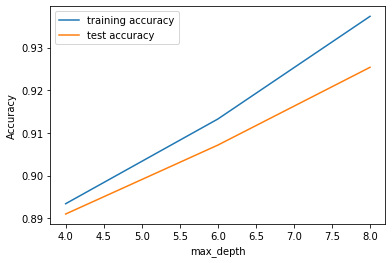

In [735]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning n_estimators

In [736]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(50, 200, 50)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=4)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rf.fit(X_train_RF, y_train_RF)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=4,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_s

In [737]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,3.56,0.17,0.06,0.01,50,{'n_estimators': 50},0.85,0.90,0.90,0.90,...,0.89,0.02,3,0.90,0.89,0.89,0.89,0.89,0.89,0.00
1,7.72,1.03,0.11,0.02,100,{'n_estimators': 100},0.86,0.90,0.90,0.90,...,0.89,0.02,1,0.90,0.89,0.89,0.89,0.89,0.89,0.00
2,11.92,1.15,0.15,0.01,150,{'n_estimators': 150},0.86,0.90,0.89,0.90,...,0.89,0.02,2,0.90,0.89,0.89,0.89,0.89,0.89,0.01


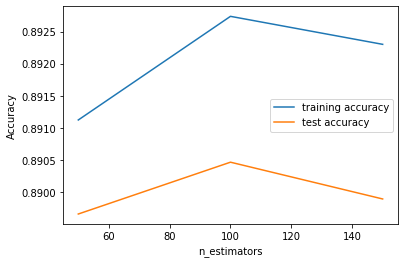

In [738]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning max_features

In [739]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [ 8, 12, 16, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth = 6)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                    
                   scoring="accuracy", return_train_score=True)
rf.fit(X_train_RF, y_train_RF)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_s

In [740]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,11.71,2.30,0.18,0.04,8,{'max_features': 8},0.87,0.92,0.91,0.91,...,0.91,0.02,5,0.92,0.91,0.91,0.91,0.91,0.91,0.00
1,13.63,2.14,0.12,0.03,12,{'max_features': 12},0.87,0.92,0.91,0.92,...,0.91,0.02,4,0.92,0.91,0.91,0.91,0.91,0.91,0.01
2,16.59,0.79,0.13,0.02,16,{'max_features': 16},0.88,0.92,0.91,0.92,...,0.91,0.02,3,0.93,0.91,0.91,0.91,0.91,0.92,0.01
3,20.05,0.64,0.12,0.01,20,{'max_features': 20},0.88,0.92,0.92,0.92,...,0.91,0.02,2,0.93,0.91,0.92,0.92,0.92,0.92,0.00
4,25.21,0.98,0.13,0.02,24,{'max_features': 24},0.88,0.92,0.92,0.92,...,0.91,0.02,1,0.93,0.92,0.92,0.92,0.92,0.92,0.01


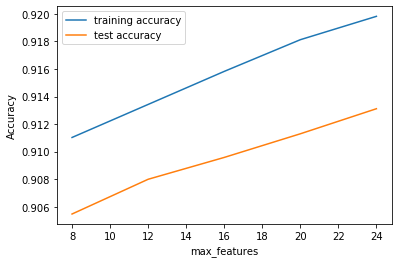

In [741]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [742]:


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(30, 200, 50)}

# instantiate the model
rf = RandomForestClassifier()

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds,                   
                   scoring="accuracy", return_train_score=True)
rf.fit(X_train_RF, y_train_RF)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [743]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,21.41,2.14,0.28,0.08,30,{'min_samples_leaf': 30},0.89,0.94,0.94,0.94,...,0.93,0.02,1,0.95,0.94,0.94,0.94,0.94,0.94,0.00
1,15.05,0.40,0.17,0.02,80,{'min_samples_leaf': 80},0.87,0.92,0.92,0.92,...,0.91,0.02,2,0.93,0.92,0.92,0.92,0.92,0.92,0.00
2,14.18,0.85,0.18,0.03,130,{'min_samples_leaf': 130},0.87,0.92,0.91,0.92,...,0.91,0.02,3,0.92,0.91,0.91,0.91,0.91,0.91,0.00
3,12.16,0.30,0.14,0.02,180,{'min_samples_leaf': 180},0.87,0.91,0.91,0.91,...,0.90,0.02,4,0.92,0.90,0.90,0.90,0.90,0.91,0.01


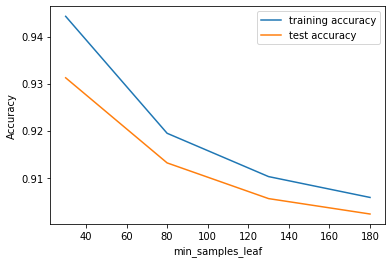

In [744]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

**Fitting the final model with the best parameters obtained from grid search.**

In [888]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=50, 
                             min_samples_split=100,
                             max_features=25,
                             n_estimators=100)

In [889]:
# fit
rfc.fit(X_train_RF,y_train_RF)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features=25,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [890]:
# predict
predictions = rfc.predict(X_test_RF)

In [891]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [892]:
print(classification_report(y_test_RF,predictions))

              precision    recall  f1-score   support

         0.0       0.97      0.94      0.96      8263
         1.0       0.50      0.69      0.58       708

    accuracy                           0.92      8971
   macro avg       0.74      0.82      0.77      8971
weighted avg       0.94      0.92      0.93      8971



In [893]:
print(confusion_matrix(y_test_RF,predictions))

[[7780  483]
 [ 219  489]]


In [894]:
print(accuracy_score(y_test_RF,predictions))

0.9217478541968566


#### Get numerical feature importances

In [257]:
importances = list(rfc.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(X_train_RF.columns, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: roam_og_mou_8        Importance: 0.22
Variable: roam_ic_mou_8        Importance: 0.17
Variable: total_ic_mou_8       Importance: 0.09
Variable: fb_user_8            Importance: 0.08
Variable: arpu_8               Importance: 0.06
Variable: loc_ic_mou_8         Importance: 0.05
Variable: loc_og_mou_8         Importance: 0.03
Variable: max_rech_amt_8       Importance: 0.03
Variable: last_day_rch_amt_8   Importance: 0.03
Variable: isd_og_mou_8         Importance: 0.02
Variable: og_others_8          Importance: 0.02
Variable: roam_og_mou_7        Importance: 0.01
Variable: loc_og_t2m_mou_8     Importance: 0.01
Variable: loc_og_t2c_mou_8     Importance: 0.01
Variable: spl_og_mou_7         Importance: 0.01
Variable: loc_ic_t2m_mou_8     Importance: 0.01
Variable: spl_ic_mou_8         Importance: 0.01
Variable: total_rech_num_8     Importance: 0.01
Variable: max_rech_data_8      Importance: 0.01
Variable: count_rech_2g_8      Importance: 0.01
Variable: count_rech_3g_8      Importanc

## Conclusions of Random Forest Algorithm

- The Model Accuracy Score that the accuracy on the Test Data Set is very High i.e. 0.93
- The model was tuned with a number of Hyperparameters for the yield

#### The main predictor variables for Telecom Churn are

- loc_ic_mou_8
- total_ic_mou_8
- loc_ic_t2m_mou_8
- last_day_rch_amt_8
- max_rech_data_8
- loc_ic_t2t_mou_8
- max_rech_amt_8
- count_rech_2g_8
- total_og_mou_8
- loc_og_t2t_mou_8
- total_rech_num_8




## XGBoost - Queen Bee Algorithm!

In [896]:
import xgboost as xgb

In [905]:
x_xgboost, y_xgboost = telecom_n.drop(['Churn'],axis=1),telecom_n[['Churn']]

In [908]:
#Create a matrix for identifying important predictors
data_dmatrix = xgb.DMatrix(data=x_xgboost,label=y_xgboost)

In [916]:
#separate the data into train and test
X_train_xg, X_test_xg, y_train_xg, y_test_xg = train_test_split(x_xgboost, y_xgboost, test_size=0.3, random_state=123)

In [917]:
#Crate XGBoost classifer model
xg_class = xgb.XGBClassifier(objective ='reg:logistic', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [918]:
#Train and Predict based on the model
xg_class.fit(X_train_xg,y_train_xg)

preds = xg_class.predict(X_test_xg)

In [919]:
print(accuracy_score(y_test_xg,preds))

0.9453795563482332


In [920]:
print(confusion_matrix(y_test_xg,preds))

[[8179  114]
 [ 376  302]]


In [926]:
params = {"objective":"reg:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=5,
                    num_boost_round=50,early_stopping_rounds=10,metrics="auc", as_pandas=True, seed=123)

In [928]:
cv_results.head()

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
0,0.81,0.00,0.81,0.01
1,0.87,0.02,0.86,0.01
2,0.89,0.01,0.88,0.01
3,0.90,0.01,0.89,0.01
4,0.90,0.01,0.89,0.01


In [939]:
#Perform KFold cross validation to obtain a better meausre of Accuracy
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold = KFold(n_splits=10, random_state=7)
results = cross_val_score(xg_class, x_xgboost, y_xgboost, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 94.55% (0.43%)


In [953]:
print(classification_report(y_test_xg,preds))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97      8293
         1.0       0.73      0.45      0.55       678

    accuracy                           0.95      8971
   macro avg       0.84      0.72      0.76      8971
weighted avg       0.94      0.95      0.94      8971



In [927]:
xg_class1 = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=10)

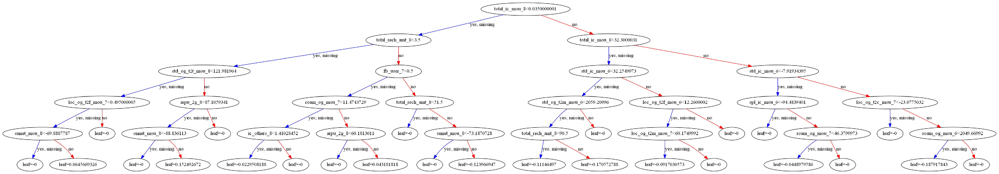

<Figure size 1440x1440 with 0 Axes>

In [951]:
import matplotlib.pyplot as plt

xgb.plot_tree(xg_class1,num_trees=0)
plt.figure(figsize=(20, 20))
plt.show()

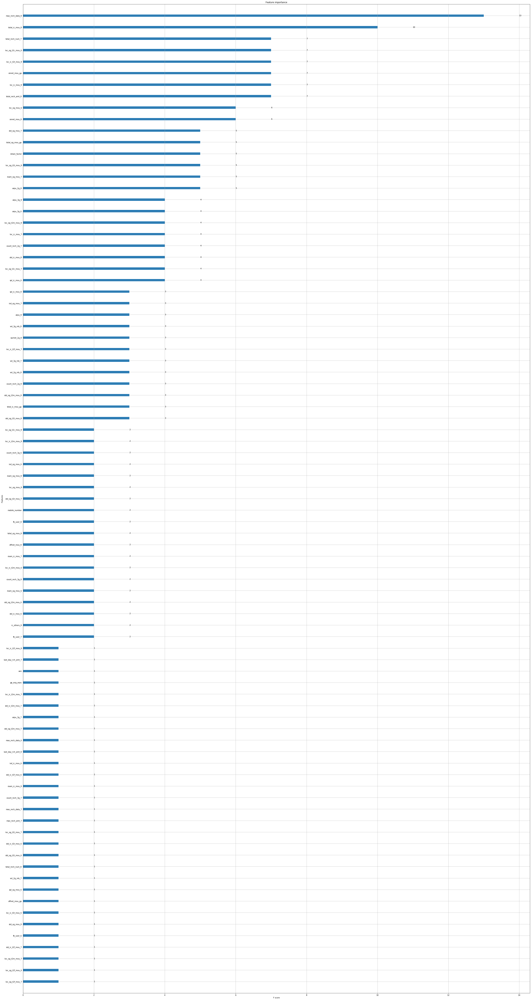

In [934]:
xgb.plot_importance(xg_class1)
plt.rcParams['figure.figsize'] = [10, 10]
plt.show()

#####                                                                                      **Fin**

- The machine Learning model with **XGBoosting** Algorithm has been chosen as the best
- The reason is that the Accuracy scores and the precision / recall scores are the highest of all the algorithms
- The performance of the algorithm is also better than most other algorithms